# **LoanTap Credit Risk Prediction**
Business case


### Context:

LoanTap is an online platform committed to delivering customized loan products to millennials. They innovate in an otherwise dull loan segment, to deliver instant, flexible loans on consumer friendly terms to salaried professionals and businessmen.

The data science team at LoanTap is building an underwriting layer to determine the creditworthiness of MSMEs as well as individuals.

LoanTap deploys formal credit to salaried individuals and businesses 4 main financial instruments:

- Personal Loan
- EMI Free Loan
- Personal Overdraft
- Advance Salary Loan

This case study will focus on the underwriting process behind Personal Loan only

### Problem Statement:

Given a set of attributes for an Individual, determine if a credit line should be extended to them. If so, what should the repayment terms be in business recommendations?

### Dataset: [loantap_logistic_regression.csv](loantap_logistic_regression.csv)

### Data dictionary:

- loan_amnt : The listed amount of the loan applied for by the borrower. If at some point in time, the credit department reduces the loan amount, then it will be reflected in this value.
- term : The number of payments on the loan. Values are in months and can be either 36 or 60.
- int_rate : Interest Rate on the loan
- installment : The monthly payment owed by the borrower if the loan originates.
- grade : LoanTap assigned loan grade
- sub_grade : LoanTap assigned loan subgrade
- emp_title :The job title supplied by the Borrower when applying for the loan.*
- emp_length : Employment length in years. Possible values are between 0 and 10 where 0 means less than one year and 10 means ten or more years.
- home_ownership : The home ownership status provided by the borrower during registration or obtained from the credit report.
- annual_inc : The self-reported annual income provided by the borrower during registration.
- verification_status : Indicates if income was verified by LoanTap, not verified, or if the income source was verified
- issue_d : The month which the loan was funded
- **loan_status : Current status of the loan - Target Variable**
- purpose : A category provided by the borrower for the loan request.
- title : The loan title provided by the borrower
- dti : A ratio calculated using the borrower’s total monthly debt payments on the total debt obligations, excluding mortgage and the requested LoanTap loan, divided by the borrower’s self-reported monthly income.
- earliest_cr_line :The month the borrower's earliest reported credit line was opened
- open_acc : The number of open credit lines in the borrower's credit file.
- pub_rec : Number of derogatory public records
- revol_bal : Total credit revolving balance
- revol_util : Revolving line utilization rate, or the amount of credit the borrower is using relative to all available revolving credit.
- total_acc : The total number of credit lines currently in the borrower's credit file
- initial_list_status : The initial listing status of the loan. Possible values are – W, F
- application_type : Indicates whether the loan is an individual application or a joint application with two co-borrowers
- mort_acc : Number of mortgage accounts.
- pub_rec_bankruptcies : Number of public record bankruptcies
- Address: Address of the individual

### Concept Used:

- Exploratory Data Analysis
- Feature Engineering
- Logistic Regression
- Precision Vs Recall Tradeoff

### What does ‘good’ look like?

- Import the dataset and do usual exploratory data analysis steps like checking the structure & characteristics of the dataset
- Check how much target variable (Loan_Status) depends on different predictor variables (Use count plots, box plots, heat maps etc)
- Check correlation among independent variables and how they interact with each other
- Simple Feature Engineering steps:
E.g.: Creation of Flags- If value greater than 1.0 then 1 else 0. This can be done on:

1. Pub_rec
2. Mort_acc
3. Pub_rec_bankruptcies

- Missing values and Outlier Treatment
- Scaling - Using MinMaxScaler or StandardScaler
- Use Logistic Regression Model from Sklearn/Statsmodel library and explain the results

### Results Evaluation:
- Classification Report
- ROC AUC curve
- Precision recall curve
- Tradeoff Questions:
How can we make sure that our model can detect real defaulters and there are less false positives? This is important as we can lose out on an opportunity to finance more individuals and earn interest on it.
Since NPA (non-performing asset) is a real problem in this industry, it’s important we play safe and shouldn’t disburse loans to anyone
- Provide actionable Insights & Recommendations

# **Problem Breakdown**

### **Primary Goal:**
- Decision: Determine whether a credit line should be extended to an individual.
- Classification Output: Binary classification (Yes or No for credit approval).

### **Secondary Goal:**
Provide recommendations on repaymentment terms for approved credit lines.

Recommendations include factors such as:
- Loan amount (how much credit to extend).
- Interest rate (based on risk).
- Loan term (length of repayment period).

### **Business Perspective:**

1. Non-Performing Assets (NPA): Loan defaults (Charged Off) lead to financial losses. The model should reduce NPAs by accurately predicting risky borrowers.
2. Risk-Based Pricing: Features like int_rate, term, and grade can help in adjusting interest rates based on risk.

### **Technical Perspective:**

1. **Data Characteristics:**
    - The dataset includes numerical (e.g., loan_amnt, int_rate), categorical (e.g., grade, purpose), and temporal (e.g., issue_date) variables.
    - Features exhibit strong correlations (e.g., loan_amnt vs. installment) and interactions that need to be addressed.
    
2. **Challenges:**
    - Class Imbalance: Fully Paid loans likely dominate the dataset.
    - Feature Engineering: Categorical variables require encoding, and some variables (e.g., grade, sub_grade) need ordinal handling.
    - Outliers and Missing Values: Numerical features such as annual_inc and dti may contain outliers or missing data requiring treatment.

# **Approach to problem**

    
### Key Questions to Address:

1. What Features Are Most Predictive? Identify and prioritize features such as int_rate, grade, and purpose based on their association with loan_status.
2. How to Handle Class Imbalance? Ensure the model performs well on both Fully Paid and Charged Off classes to minimize false negatives (misclassified defaulters).
3. What Are the Trade-offs Between Precision and Recall? Evaluate the model's ability to correctly classify defaulters (recall) versus avoiding missed opportunities (precision).
4. Can Insights Drive Lending Policies? Use the model’s output and feature importance to guide interest rate adjustments, term length recommendations, and targeted lending.
    
### Deliverables:

1. Predictive Model: A logistic regression or other classification model to predict loan_status.
2. Actionable Insights: Feature importance rankings, threshold tuning, and risk-based lending strategies.
3. Visualizations: Correlation heatmaps, pair plots, and comparisons of default trends across features (e.g., term, grade, home_ownership).

### Success Metrics:

1. Model Accuracy:
Balanced accuracy across both classes (Fully Paid and Charged Off).
2. Precision-Recall Trade-off:
High recall to correctly identify defaulters, minimizing NPAs.
3. Business Impact:
Reduction in loan defaults and improved profitability through risk-based pricing.

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, roc_auc_score, precision_recall_curve, confusion_matrix
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")

In [ ]:
!pip install gdown
import gdown

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:

# Specify the full path to your dataset
file_path = '/content/drive/My Drive/Loan Tap Logistic Regression/logistic_regression.csv'

# Load the dataset
data = pd.read_csv(file_path)
data_original = data.copy()

print(f"dataset has been loaded.\n\n. Dataset has {data.shape[0]} rows and {data.shape[1]} columns")

dataset has been loaded.

. Dataset has 396030 rows and 27 columns


In [ ]:
# Create an empty dictionary to store mapping dictionaries for all columns
mapping_dictionaries = {}

# Set default figure size and resolution
plt.rcParams['figure.figsize'] = [15, 6]  # Adjust width x height globally
plt.rcParams['figure.dpi'] = 300  # Adjust resolution globally


# **Feature Engineering: Creating New Features and Data Cleaning**

### **Duplicate values**

In [ ]:
print("\nNumber of Duplicate Rows:", data.duplicated().sum())


Number of Duplicate Rows: 0


### **Identifying categorical features**

In [ ]:
# Display unique values for each column (if needed for categorical data)
categorical_columns = data.select_dtypes(include=['object']).columns.tolist()
print("Categorical Variables:", categorical_columns)
for column in categorical_columns:
    unique_values = data[column].nunique()
    print(f"Column '{column}' has {unique_values} unique values.")
print("Column Names:", data.columns.tolist())

Categorical Variables: ['term', 'grade', 'sub_grade', 'emp_title', 'emp_length', 'home_ownership', 'verification_status', 'issue_d', 'loan_status', 'purpose', 'title', 'earliest_cr_line', 'initial_list_status', 'application_type', 'address']
Column 'term' has 2 unique values.
Column 'grade' has 7 unique values.
Column 'sub_grade' has 35 unique values.
Column 'emp_title' has 173105 unique values.
Column 'emp_length' has 11 unique values.
Column 'home_ownership' has 6 unique values.
Column 'verification_status' has 3 unique values.
Column 'issue_d' has 115 unique values.
Column 'loan_status' has 2 unique values.
Column 'purpose' has 14 unique values.
Column 'title' has 48816 unique values.
Column 'earliest_cr_line' has 684 unique values.
Column 'initial_list_status' has 2 unique values.
Column 'application_type' has 3 unique values.
Column 'address' has 393700 unique values.
Column Names: ['loan_amnt', 'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title', 'emp_length', 'h

Keeping only the most relevant and removing columns that have many unique values. These variables have very high cardinality and are unlikely to provide significant predictive power. Removing the target variable from this list.

### **Parsing address column to create city and state columns**

In [ ]:
import pandas as pd

# Updated function to handle standard and military addresses
def extract_city_state(address):
    try:
        # Split the address into lines
        parts = address.split("\r\n")[-1]  # Extract the last line (e.g., "FPO AE 30723")

        # Check for military address patterns
        if "FPO" in parts or "APO" in parts or "DPO" in parts:
            parts_split = parts.split()
            city = parts_split[0]  # Extract the postal designator (e.g., "FPO")
            state = parts_split[1] if len(parts_split) > 1 else None  # Extract the state code (e.g., "AE")
            return pd.Series([city, state])
        else:
            # Handle standard addresses
            city_state = parts.split(",")  # Split into City and State ZIP
            city = city_state[0].strip()  # Extract the city
            state = city_state[1].strip().split()[0]  # Extract the state
            return pd.Series([city, state])
    except Exception as e:
        return pd.Series([None, None])  # Return None if parsing fails

# Apply the function to extract city and state
data[['city', 'state']] = data['address'].apply(extract_city_state)

# Display rows with missing city/state values for debugging
missing_city_state = data[data['city'].isnull() | data['state'].isnull()]
print("City and State extracted from address column. \n\n Rows with missing city or state values after extraction:")
print(missing_city_state[['address', 'city', 'state']])

City and State extracted from address column. 

 Rows with missing city or state values after extraction:
Empty DataFrame
Columns: [address, city, state]
Index: []


### **Removing address column**

In [ ]:
data = data.drop(columns=['address'])

### **Cleaning "title" column**

In [ ]:
import pandas as pd

# Sample cleaning function
def clean_title(title):

    # Handle NaN or non-string entries
    if not isinstance(title, str):
        return "unknown"  # Replace with a default value, e.g., "unknown"

    # Convert to lowercase
    title = title.lower()

    # Remove punctuation and extra spaces
    title = ''.join(char for char in title if char.isalnum() or char.isspace()).strip()

    # Mapping similar titles to standard names
    title_mappings = {
        'debt consolidation': ['debt consolidation', 'debtconsolidation', 'debt consolidating'],
        'home improvement': ['home improvement', 'homeimprovement'],
        'credit card': ['credit card', 'creditcard', 'cc payoff'],
        'medical expenses': ['medical', 'medical expenses'],
        'vacation': ['vacation', 'holiday'],
        'car': ['car', 'auto'],
        # Add more mappings as needed
    }

    # Normalize to standard names based on mappings
    for standard, variations in title_mappings.items():
        if title in variations:
            return standard

    # Keyword-based cleaning
    if "consolidate" or "consolidating" or "consolidat" in title:
        return "debt consolidation"
    elif "home improvement" or "improvement" in title:
        return "home improvement"
    elif "credit card" in title or "cc payoff" in title:
        return "credit card"
    elif "medical" in title:
        return "medical expenses"
    elif "vacation" in title or "holiday" in title:
        return "vacation"
    elif "car" in title or "auto" in title:
        return "car"
    else:
        return title.strip()  # Return cleaned title if no keyword match

    # Return the original title if no mapping found
    return title

# Apply the cleaning function to the 'title' column
data['title_cleaned'] = data['title'].apply(clean_title)

# Removing title column
data = data.drop(columns='title')

# Display the top 10 unique cleaned titles
print("Title column cleaned: \n\n", data['title_cleaned'].value_counts().head(10))


Title column cleaned: 

 title_cleaned
debt consolidation    370290
home improvement       17305
medical expenses        3162
vacation                1892
unknown                 1756
credit card             1418
car                      207
Name: count, dtype: int64


### **Creating temporal columns**

- issue_year: The year when the loan was issued eg. 2016. year extracted from issue_d column
- issue_month: The month when the loan was issued (numeric: 1 for January, 12 for December).. month extracted from issue_month column
- earliest_cr_line: orginal column converted to datetime column
- credit_history_length: Total number of days between the earliest credit line date and the loan issue date.
- months_since_issued
- months_since_earliest_cr_line_month

In [ ]:
# Columns: ['issue_d', earliest_cr_line]

# Extracting features from loan issue date
data['issue_d'] = pd.to_datetime(data['issue_d'], format='%b-%Y')
data['issue_year'] = data['issue_d'].dt.year
data['issue_month'] = data['issue_d'].dt.month
data['months_since_issued'] = ((pd.Timestamp.now() - data['issue_d']).dt.days / 30).astype(int)

# extracting features from earliest_cr_line
data['earliest_cr_line'] = pd.to_datetime(data['earliest_cr_line'], format='%b-%Y')
#data['earliest_cr_line_year'] = data['earliest_cr_line'].dt.year
#data['earliest_cr_line_month'] = data['earliest_cr_line'].dt.month
data['months_since_earliest_cr_line_month'] = ((pd.Timestamp.now() - data['earliest_cr_line']).dt.days / 30).astype(int)

# Calculating the length of the borrower’s credit history in days.
data['credit_history_length'] = (data['issue_d'] - data['earliest_cr_line']).dt.days

# Removing issue_d original column
data = data.drop(columns=['issue_d'])

temporal_columns = ['issue_year', 'issue_month', 'months_since_issued', 'earliest_cr_line_year',
                    'earliest_cr_line_month', 'months_since_earliest_cr_line_month', 'credit_history_length']

print("Temporal columns have been created \n\n", temporal_columns)

Temporal columns have been created 

 ['issue_year', 'issue_month', 'months_since_issued', 'earliest_cr_line_year', 'earliest_cr_line_month', 'months_since_earliest_cr_line_month', 'credit_history_length']


### **Creating flag columns**

1. pub_rec: Represents the number of derogatory public records.A flag can indicate whether there are any public records (1 if > 1, else 0).
2. mort_acc: Represents the number of mortgage accounts. A flag can distinguish whether a borrower has multiple mortgage accounts (1 if > 1, else 0).
3. pub_rec_bankruptcies: Represents the number of public record bankruptcies. A flag can indicate whether there are multiple bankruptcies (1 if > 1, else 0).
4. open_acc: Number of open credit lines. A flag could distinguish between borrowers with a single open credit line and those with multiple lines (e.g., 1 if > 1, else 0).
5. revol_util: Revolving line utilization rate. A flag could be created to identify borrowers who exceed a threshold (e.g., 50% utilization).
6. dti (Debt-to-Income Ratio): Represents the borrower’s total monthly debt obligations relative to their income. A flag could identify high-risk borrowers with a high DTI ratio (e.g., 1 if > 0.4, else 0).

In [ ]:
# Identifying flag columns
flag_columns = ['pub_rec_flag', 'mort_acc_flag', 'pub_rec_bankruptcies_flag', 'open_acc_flag', 'total_acc_flag', 'high_revol_util_flag', 'high_dti_flag' ]

# Creating flags for the specified columns
data['pub_rec_flag'] = (data['pub_rec'] > 1).astype(int)
data['mort_acc_flag'] = (data['mort_acc'] > 1).astype(int)
data['pub_rec_bankruptcies_flag'] = (data['pub_rec_bankruptcies'] > 1).astype(int)

data['open_acc_flag'] = (data['open_acc'] > 1).astype(int)
data['total_acc_flag'] = (data['total_acc'] > 1).astype(int)
data['high_revol_util_flag'] = (data['revol_util'] > 50).astype(int)
data['high_dti_flag'] = (data['dti'] > 0.4).astype(int)

# Display the updated dataset
print("Flag columns have been created: \n\n", data[['pub_rec_flag', 'mort_acc_flag', 'pub_rec_bankruptcies_flag', 'open_acc_flag', 'total_acc_flag', 'high_revol_util_flag', 'high_dti_flag' ]].head(3))

Flag columns have been created: 

    pub_rec_flag  mort_acc_flag  pub_rec_bankruptcies_flag  open_acc_flag  \
0             0              0                          0              1   
1             0              1                          0              1   
2             0              0                          0              1   

   total_acc_flag  high_revol_util_flag  high_dti_flag  
0               1                     0              1  
1               1                     1              1  
2               1                     1              1  


# **Missing data**

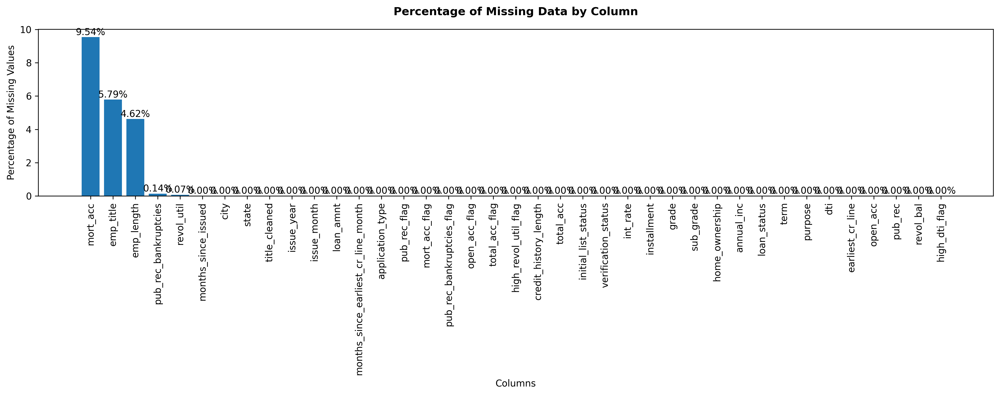

In [ ]:
def missing_data_analysis(df):
    # Calculate the count and percentage of missing values in each column
    missing_counts = df.isnull().sum()
    missing_percentages = (missing_counts / len(df)) * 100

    # Create a DataFrame with the results
    missing_data = pd.DataFrame({
        'Column': missing_counts.index,
        'Missing Count': missing_counts.values,
        'Percent Missing': missing_percentages.values
    })

    # Sort the DataFrame by percentage of missing values (descending)
    missing_data = missing_data.sort_values('Percent Missing', ascending=False).reset_index(drop=True)

    # Display the results
    #print("Missing Data Analysis:")
    #print(missing_data.to_string(index=False, float_format='{:.2f}'.format))

    # Visualize the results
    plt.bar(missing_data['Column'], missing_data['Percent Missing'])
    plt.title('Percentage of Missing Data by Column', fontsize=12, pad=15, fontweight='bold')
    plt.xlabel('Columns')
    plt.ylabel('Percentage of Missing Values')
    plt.xticks(rotation=90)

    # Add value labels on top of each bar
    for i, v in enumerate(missing_data['Percent Missing']):
        plt.text(i, v, f'{v:.2f}%', ha='center', va='bottom')

    plt.tight_layout()
    plt.show()

    return missing_data

# Assuming you have a DataFrame called 'df'
# If not, you can load your data like this:
# df = pd.read_csv('your_dataset.csv')

# Call the function
result = missing_data_analysis(data)

### **Treating missing values using Median Imputation**

* Since the dataset seem to have skewness and outliers, using mean imputation would be ineffective
* Since proportion of missing data in general is below 10% for the dataset, median imputation can be used for numeric variables
* Imputing misisng values in emp_length column by creating a Separate Category "Unknown"

In [ ]:
# Impute all missing values using the median
data = data.fillna(data.median(numeric_only=True))

### **Treating missing values for categorical columns**

In [ ]:
# Replace missing values with a category like Unknown before encoding.
data['emp_length'] = data['emp_length'].fillna('Unknown')
data['emp_title'] = data['emp_title'].fillna('Unknown')
data['title_cleaned'] = data['title_cleaned'].fillna('Unknown')

# Verify if there are any missing values left anymore
print("Missing values have been treated.\n\n. Rechecking below: \n\n")
print("\nNumber of missing values after median imputation: ", data.isnull().sum())  # Should print 0 if all missing values are handled

Missing values have been treated.

. Rechecking below: 



Number of missing values after median imputation:  loan_amnt                              0
term                                   0
int_rate                               0
installment                            0
grade                                  0
sub_grade                              0
emp_title                              0
emp_length                             0
home_ownership                         0
annual_inc                             0
verification_status                    0
loan_status                            0
purpose                                0
dti                                    0
earliest_cr_line                       0
open_acc                               0
pub_rec                                0
revol_bal                              0
revol_util                             0
total_acc                              0
initial_list_status                    0
application_type             

# **Outliers**

In [ ]:
import seaborn as sns
sub_columns = ['loan_amnt', 'int_rate', 'annual_inc', 'installment', 'dti',
                  'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc', 'mort_acc']

# Identify outliers using IQR
outliers = {}
for col in sub_columns:
    q1 = data[col].dropna().quantile(0.25)  # First quartile
    q3 = data[col].dropna().quantile(0.75)  # Third quartile
    iqr = q3 - q1  # Interquartile range
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr

    # Detect outliers
    outliers[col] = data[(data[col] < lower_bound) | (data[col] > upper_bound)]
    print(f"{col} - Outliers detected: {outliers[col].shape[0]}")

# Adjust the number of rows and columns for the grid
n_cols = 2  # Number of columns in the grid
n_rows = -(-len(sub_columns) // n_cols)  # Calculate rows dynamically for the given columns
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, n_rows * 6))
axes = axes.flatten()

# Generate box plots for each numerical column
for i, col in enumerate(sub_columns):
    sns.boxplot(data=data, y=col, palette='husl', ax=axes[i])
    axes[i].set_title(f'Box Plot for {col}', fontsize=14, pad=10)
    axes[i].set_ylabel(col, fontsize=12)

# Remove any unused subplots
for j in range(len(sub_columns), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


loan_amnt - Outliers detected: 191
int_rate - Outliers detected: 3777
annual_inc - Outliers detected: 16700
installment - Outliers detected: 11250
dti - Outliers detected: 275
open_acc - Outliers detected: 10307
pub_rec - Outliers detected: 57758
revol_bal - Outliers detected: 21259
revol_util - Outliers detected: 12
total_acc - Outliers detected: 8499
mort_acc - Outliers detected: 6843


## **Removing Outliers**

Validating dataset to find the best approach to removing outliers. Evaluating between using IQR method and using 68-95-99 rule

### **Checking normality: Using QQ Plots**

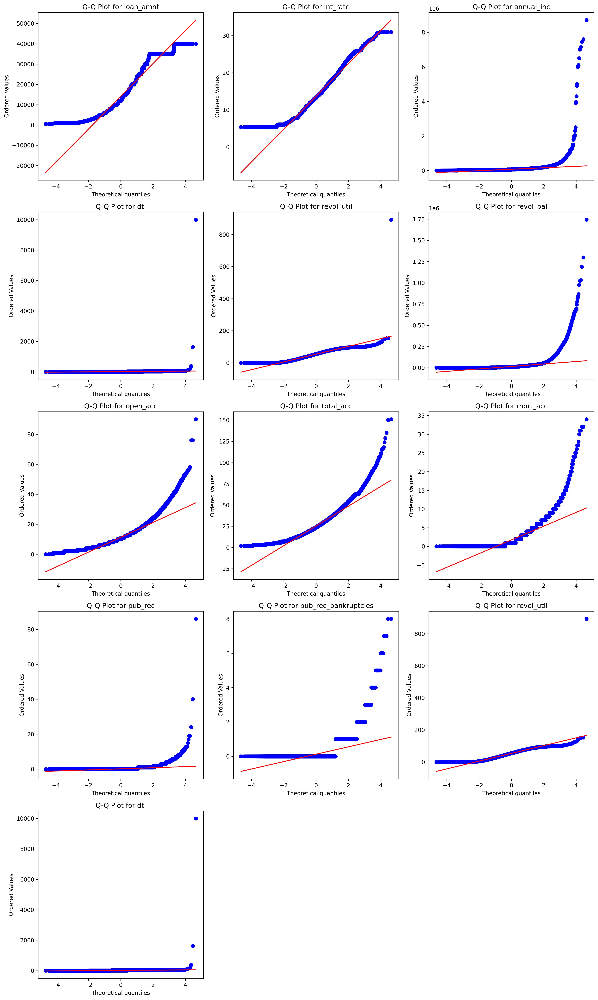

In [ ]:
from scipy.stats import probplot

numerical_columns = ['loan_amnt', 'int_rate', 'annual_inc', 'dti', 'revol_util', 'revol_bal']
flagged_columns = ['open_acc', 'total_acc', 'mort_acc', 'pub_rec', 'pub_rec_bankruptcies', 'revol_util', 'dti' ]

# Select numeric columns for outlier removal
sub_columns = numerical_columns + flagged_columns

# Dynamically set the grid size for subplots
num_cols = len(sub_columns)
rows = (num_cols // 3) + (num_cols % 3)  # 2 columns per row

# Generate Q-Q plots for all numeric columns
plt.figure(figsize=(15, 5 * rows))
for i, col in enumerate(sub_columns, 1):
    plt.subplot(rows, 3, i)
    probplot(data[col], dist="norm", plot=plt)
    plt.title(f"Q-Q Plot for {col}")
plt.tight_layout()
plt.show()

- Columns with significant deviations:

    - annual_inc: Shows heavy-tailed behavior, likely due to extreme income values (positive skew).
    - dti, revol_bal, revol_util, total_acc: Deviations from the red line in tails suggest outliers and non-normality.
    - credit_history_length: Long tails suggest the presence of extreme values.
    - flags (e.g., high_dti_flag, open_acc_flag): Binary data cannot follow a normal distribution (not suitable for this test).

- Columns with approximate normality:

    - loan_amnt, installment, int_rate: These follow the red line reasonably well, suggesting near-normal distributions.

### **Checking Normality using Statistical Shapiro Wilk Test**

In [ ]:
from scipy.stats import shapiro

# Select numeric columns for outlier removal
sub_columns = data.select_dtypes(include=['number']).columns

for col in sub_columns:
    stat, p = shapiro(data[col])
    print(f"\n**********Shapiro-Wilk Test for column {col}: Statistic={stat}, p-value={p}**********")
    if p > 0.05:
        print("Fail to reject the null hypothesis: Data is normally distributed.")
    else:
        print("Reject the null hypothesis: Data is not normally distributed.")


**********Shapiro-Wilk Test for column loan_amnt: Statistic=0.938523436214568, p-value=2.6866136923061863e-125**********
Reject the null hypothesis: Data is not normally distributed.

**********Shapiro-Wilk Test for column int_rate: Statistic=0.981772966365056, p-value=3.36714149848964e-92**********
Reject the null hypothesis: Data is not normally distributed.

**********Shapiro-Wilk Test for column installment: Statistic=0.935793447073033, p-value=1.4155799268013085e-126**********
Reject the null hypothesis: Data is not normally distributed.

**********Shapiro-Wilk Test for column annual_inc: Statistic=0.46119931117012314, p-value=3.2609232297643485e-197**********
Reject the null hypothesis: Data is not normally distributed.

**********Shapiro-Wilk Test for column dti: Statistic=0.2090257182947357, p-value=1.2099161863811298e-211**********
Reject the null hypothesis: Data is not normally distributed.

**********Shapiro-Wilk Test for column open_acc: Statistic=0.9306357015064476, p-va

Given the observed Q-Q plots, shapiro wilk tests and skewness and kurtosis values, many columns do not follow a normal distribution. Therefore, using the 68-95-99 rule (based on the assumption of normality) is not ideal for outlier removal in this dataset.

### **Removing Outliers using IQR Clipping**

loan_amnt - Total rows before removal: 396030
loan_amnt - Total rows after removal: 395839
annual_inc - Total rows before removal: 396030
annual_inc - Total rows after removal: 379210
installment - Total rows before removal: 396030
installment - Total rows after removal: 368969
open_acc - Total rows before removal: 396030
open_acc - Total rows after removal: 360112
pub_rec - Total rows before removal: 396030
pub_rec - Total rows after removal: 306138
revol_bal - Total rows before removal: 396030
revol_bal - Total rows after removal: 292033
revol_util - Total rows before removal: 396030
revol_util - Total rows after removal: 292023
total_acc - Total rows before removal: 396030
total_acc - Total rows after removal: 286887
mort_acc - Total rows before removal: 396030
mort_acc - Total rows after removal: 273465


************* Total Dataset Changes ************
Before outlier removal: 396030 rows
After outlier removal: 273465 rows
Percentage reduction in rows: 30.95%


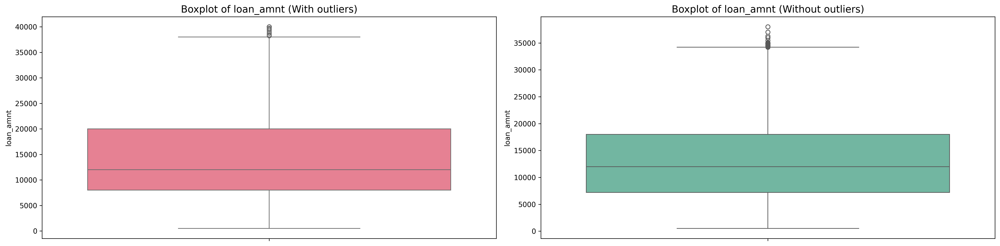

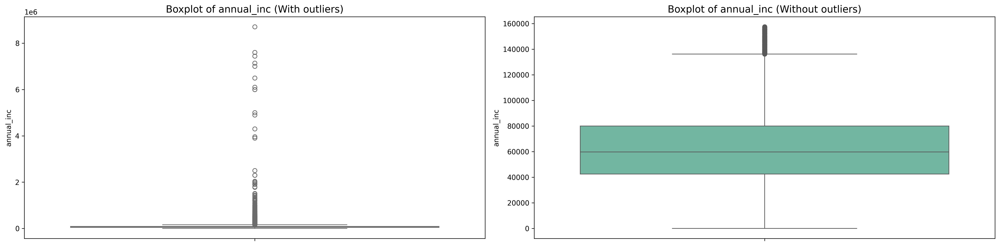

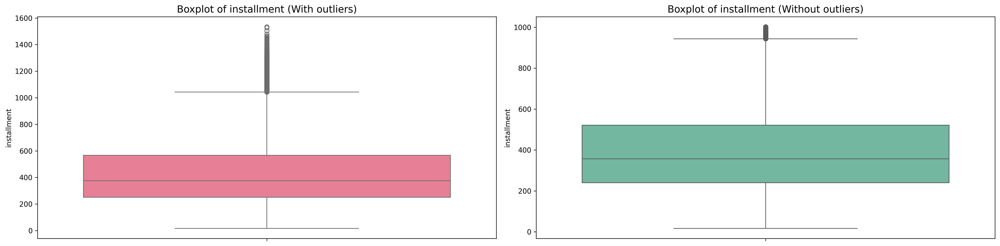

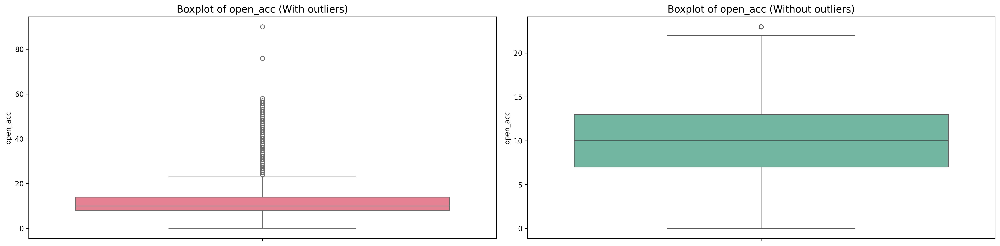

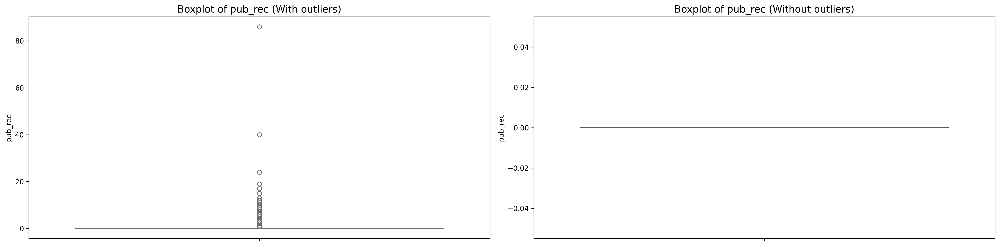

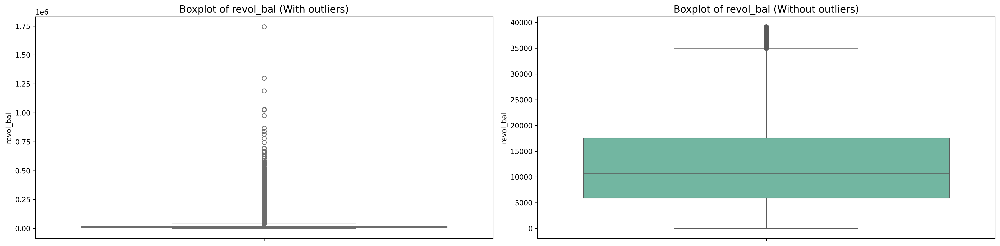

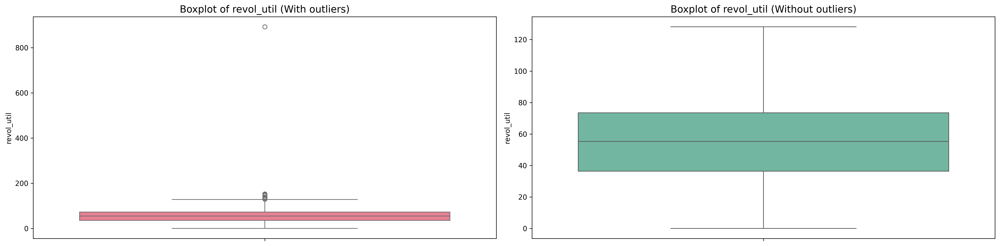

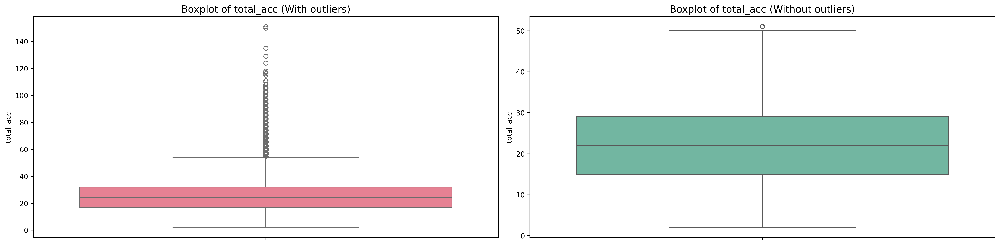

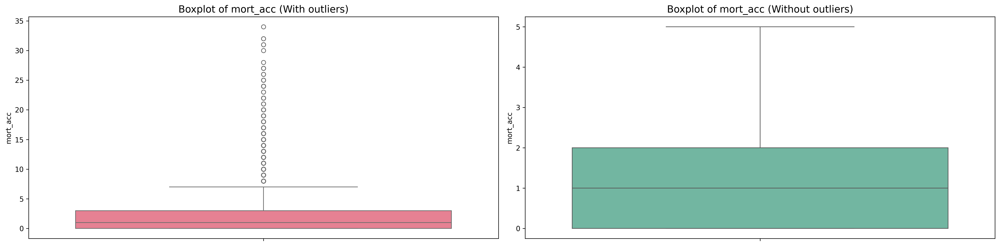

In [ ]:
import seaborn as sns

# List of skewed columns to handle outliers
skewed_columns = ['loan_amnt', 'annual_inc', 'installment', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc', 'mort_acc']

# Create a copy of the dataset
data_outliers_rm = data.copy()

# Outlier removal using the IQR method
for col in skewed_columns:
    q1 = data_outliers_rm[col].quantile(0.25)  # First quartile
    q3 = data_outliers_rm[col].quantile(0.75)  # Third quartile
    iqr = q3 - q1  # Interquartile range
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr

    # Filter the dataset to remove outliers
    data_outliers_rm = data_outliers_rm[(data_outliers_rm[col] >= lower_bound) & (data_outliers_rm[col] <= upper_bound)]

    # Print the change in the number of rows after removal for each column
    print(f"{col} - Total rows before removal: {data.shape[0]}")
    print(f"{col} - Total rows after removal: {data_outliers_rm.shape[0]}")

# Print overall dataset changes
print(f"\n\n************* Total Dataset Changes ************")
print(f"Before outlier removal: {data.shape[0]} rows")
print(f"After outlier removal: {data_outliers_rm.shape[0]} rows")
percentage_reduction = round(((data.shape[0] - data_outliers_rm.shape[0]) / data.shape[0]) * 100, 2)
print(f"Percentage reduction in rows: {percentage_reduction}%")

# Visualize boxplots before and after outlier removal
for col in skewed_columns:
    plt.figure(figsize=(20, 5))

    # Before outlier removal
    plt.subplot(1, 2, 1)
    sns.boxplot(data=data, y=col, palette='husl')
    plt.title(f"Boxplot of {col} (With outliers)", fontsize=14)

    # After outlier removal
    plt.subplot(1, 2, 2)
    sns.boxplot(data=data_outliers_rm, y=col, palette='Set2')
    plt.title(f"Boxplot of {col} (Without outliers)", fontsize=14)

    plt.tight_layout()
    plt.show()


# **Feature Encoding**

In [ ]:
data_encoded = data_outliers_rm.copy()

In [ ]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
mapping_dictionaries = {}

### **Binary Encoding of Target**

Converting Target Variable to Numeric. Binary encoding (using LabelEncoder)
Charged Off is the event of interest and hence encoded as 1 (positive class)

In [ ]:
# Encode 'loan_status' if it's not already encoded
loan_status_encodemap = {'Fully Paid': 1, 'Charged Off': 0}
data_encoded['loan_status'] = data_encoded['loan_status'].map(loan_status_encodemap)
mapping_dictionaries['loan_status'] = loan_status_encodemap
#data_encoded['loan_status'].head()

### **Encoding other predictors**

In [ ]:
# ******* BINARY ENCODING *************#
# Columns: ['initial_list_status']
data_encoded['initial_list_status'] = label_encoder.fit_transform(data_encoded['initial_list_status'])
mapping_dictionaries['initial_list_status'] = dict(
    zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_))
)

### **Label Encoding**

In [ ]:
# ******* LABEL ENCODING *************#
label_encode_cols = ['term', 'application_type', 'title_cleaned', 'emp_title', 'purpose', 'home_ownership']
for col in label_encode_cols:
    data_encoded[col] = label_encoder.fit_transform(data_encoded[col].astype(str))
    mapping_dict = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))
    mapping_dictionaries[col] = mapping_dict

### **Ordinal Encoding**

In [ ]:
# ******* ORDINAL ENCODING *************#
# Columns: ['emp_length', 'grade', 'sub_grade']
emp_length_order = {
    '< 1 year': 0, '1 year': 1, '2 years': 2, '3 years': 3, '4 years': 4,
    '5 years': 5, '6 years': 6, '7 years': 7, '8 years': 8, '9 years': 9, '10+ years': 10, 'Unknown': 11
}
data_encoded['emp_length'] = data_encoded['emp_length'].map(emp_length_order)
mapping_dictionaries['emp_length'] = emp_length_order

verification_status_order = {'Not Verified': 0, 'Source Verified': 1, 'Verified': 2}
data_encoded['verification_status'] = data_encoded['verification_status'].map(verification_status_order)
mapping_dictionaries['verification_status'] = verification_status_order

grade_order = {'A': 0, 'B': 1, 'C': 2, 'D': 3, 'E': 4, 'F': 5, 'G': 6}
data_encoded['grade'] = data_encoded['grade'].map(grade_order)
mapping_dictionaries['grade'] = grade_order

# Define the correct order for sub_grades
sub_grade_order = {f"{g}{n}": i for n in range(1, 6) for i, g in enumerate('ABCDEFG', start=(n - 1) * 7)}
data_encoded['sub_grade'] = data_encoded['sub_grade'].map(sub_grade_order)
mapping_dictionaries['sub_grade'] = sub_grade_order

### **Target Encoding "City" and "State" columns**

- city_encoded: The mean repayment rate (loan_status) for each city.
Example: If a city has 80% Fully Paid borrowers (loan_status = 1), the city_encoded value will be 0.8.
  - It highlights city-level repayment trends.
  - Local Variation: provides more granular insight into specific cities, revealing intra-state variations.

- state_encoded: The mean repayment rate (loan_status) for each state.
Example: If a state has 90% Fully Paid borrowers, the state_encoded value will be 0.9.
  - It provides a higher-level, regional repayment trend,
  - Regional loan Performance: highlights how borrowers in a particular state generally perform in terms of loan repayment.

- Geographical Predictors:
These encoded values act as predictors of loan repayment likelihood based on historical behavior.

In [ ]:
# Calculate mean loan_status for each city and state
city_mean = data_encoded.groupby('city')['loan_status'].mean()
state_mean = data_encoded.groupby('state')['loan_status'].mean()

# Map the mean values to the dataset
data_encoded['city_encoded'] = data_encoded['city'].map(city_mean)
data_encoded['state_encoded'] = data_encoded['state'].map(state_mean)

# Fill missing values (if any) with the global mean
global_mean = data_encoded['loan_status'].mean()
data_encoded['city_encoded'].fillna(global_mean, inplace=True)
data_encoded['state_encoded'].fillna(global_mean, inplace=True)

# Verify that no missing values remain
print(data_encoded[['city_encoded', 'state_encoded']].isnull().sum())
print(data_encoded.head())

city_encoded     0
state_encoded    0
dtype: int64
   loan_amnt  term  int_rate  installment  grade  sub_grade  emp_title  \
0    10000.0     0     11.44       329.48      1         22      61642   
1     8000.0     0     11.99       265.68      1         29      25653   
2    15600.0     0     10.49       506.97      1         15      96216   
3     7200.0     0      6.49       220.65      0          7      21473   
4    24375.0     1     17.27       609.33      2         30      29461   

   emp_length  home_ownership  annual_inc  ...  credit_history_length  \
0          10               5    117000.0  ...                   8980   
1           4               1     65000.0  ...                   3836   
2           0               5     43057.0  ...                   2710   
3           6               5     54000.0  ...                   2983   
4           9               1     55000.0  ...                   5145   

   pub_rec_flag  mort_acc_flag  pub_rec_bankruptcies_flag open_ac

### Checking missing values after encoding

In [ ]:
# Display the remaining columns to confirm
#print("**********Remaining columns after removal of original columns:*********\n")
print("\nFeatures have been encoded.")
print("\n\nNumber of missing values after encoding: \n", data_encoded.isnull().sum())


Features have been encoded.


Number of missing values after encoding: 
 loan_amnt                              0
term                                   0
int_rate                               0
installment                            0
grade                                  0
sub_grade                              0
emp_title                              0
emp_length                             0
home_ownership                         0
annual_inc                             0
verification_status                    0
loan_status                            0
purpose                                0
dti                                    0
earliest_cr_line                       0
open_acc                               0
pub_rec                                0
revol_bal                              0
revol_util                             0
total_acc                              0
initial_list_status                    0
application_type                       0
mort_acc                

# **Feature Reduction**

### **Principal Component Analysis (PCA):**

Combine correlated features into a single principal component to reduce redundancy:

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Assuming 'loan_amnt' and 'installment' are in the dataset
scaler = StandardScaler()

# Step 1: Scale the data
scaled_loaninstpca = scaler.fit_transform(data_encoded[['loan_amnt', 'installment']])

# Step 2: Apply PCA
pca = PCA(n_components=1)
data_encoded['loan_amnt_inst_pca'] = pca.fit_transform(scaled_loaninstpca)

# Step 3: Optional - Check explained variance
explained_variance = pca.explained_variance_ratio_
print(f"Explained Variance by the PCA Component: {explained_variance[0]:.2f}")

# Display the updated dataset
print(data_encoded.head())


Explained Variance by the PCA Component: 0.97
   loan_amnt  term  int_rate  installment  grade  sub_grade  emp_title  \
0    10000.0     0     11.44       329.48      1         22      61642   
1     8000.0     0     11.99       265.68      1         29      25653   
2    15600.0     0     10.49       506.97      1         15      96216   
3     7200.0     0      6.49       220.65      0          7      21473   
4    24375.0     1     17.27       609.33      2         30      29461   

   emp_length  home_ownership  annual_inc  ...  pub_rec_flag  mort_acc_flag  \
0          10               5    117000.0  ...             0              0   
1           4               1     65000.0  ...             0              1   
2           0               5     43057.0  ...             0              0   
3           6               5     54000.0  ...             0              0   
4           9               1     55000.0  ...             0              0   

   pub_rec_bankruptcies_flag  open

# **EDA and Data Visualisations**

## **Loan Status Distribution**

Loan Status Distribution in %:
loan_status
Fully Paid     80.387092
Charged Off    19.612908
Name: proportion, dtype: float64


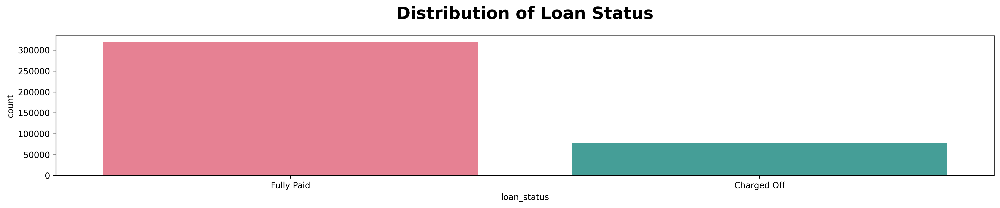

In [ ]:
plt.figure(figsize=(20,3))
sns.countplot(x='loan_status', data=data, palette='husl')
plt.title('Distribution of Loan Status', fontsize=20, pad=20, fontweight='bold')
print("Loan Status Distribution in %:")
print(data['loan_status'].value_counts(normalize=True) * 100)

The target variable loan_status has the following distribution:
Fully Paid: 80.39% of loans.
Charged Off: 19.61% of loans.
This indicates an imbalance in the dataset, with a majority of loans being fully paid.

## **Emp title Vs Loan Borrowers**

Text(0, 0.5, 'Number of Borrowers')

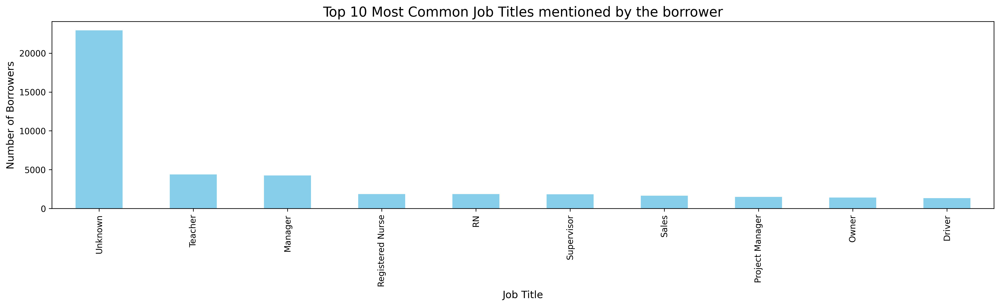

In [ ]:
# Plot the top 10 most common job titles
emp_title_counts = data['emp_title'].value_counts()
plt.figure(figsize=(20,4))
emp_title_counts.head(10).plot(kind='bar', color='skyblue')
plt.title("Top 10 Most Common Job Titles mentioned by the borrower", fontsize=16)
plt.xlabel("Job Title", fontsize=12)
plt.ylabel("Number of Borrowers", fontsize=12)

## **State Vs Loan Borrowers**

In [ ]:
# Correlation between frequency-encoded column and target
correlation = data_encoded['state_encoded'].corr(data_encoded['loan_status'])
print(f"Pearson Correlation with target: {correlation}")

# Spearman correlation
from scipy.stats import spearmanr
spearman_corr, _ = spearmanr(data_encoded['state_encoded'], data_encoded['loan_status'])
print(f"Spearman Correlation between state and loan status: {spearman_corr:.2f}")

Pearson Correlation with target: 0.014014640832011406
Spearman Correlation between state and loan status: 0.01


Both correlations are zero indicating no linear relationships or monotonic relationships with the target. State-level information alone has minimal predictive value for determining loan repayment behavior.

## **City Vs Loan Borrowers**

In [ ]:
# Correlation between frequency-encoded column and target
correlation = data_encoded['city_encoded'].corr(data_encoded['loan_status'])
print(f"Pearson Correlation with target: {correlation}")

# Spearman correlation
from scipy.stats import spearmanr
spearman_corr, _ = spearmanr(data_encoded['city_encoded'], data_encoded['loan_status'])
print(f"Spearman Correlation between state and loan status: {spearman_corr:.2f}")

Pearson Correlation with target: 0.4621408225596079
Spearman Correlation between state and loan status: 0.40


A moderately positive linear correlation exists between city and target. This indicates that cities play a more important role than states in predicting loan repayment behavior. Borrowers from certain cities are more likely to fully repay or default.

A moderately strong monotonic relationship suggests that repayment behavior is influenced by the borrower's city, even if the relationship isn't strictly linear.
Some cities may consistently have better repayment trends, while others show higher default rates.

City-level data captures regional repayment trends better than state-level data, making city a more valuable feature for predicting loan repayment behavior.

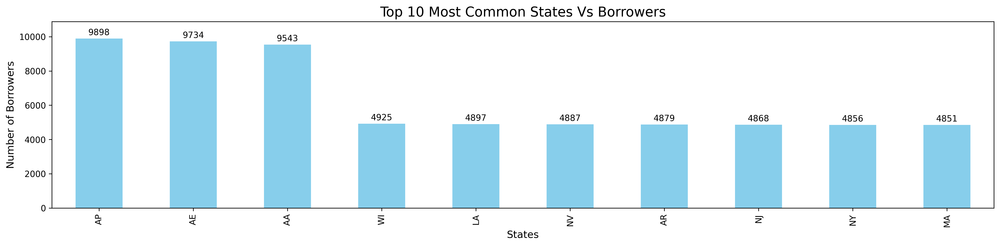

In [ ]:
state_counts = data_encoded['state'].value_counts()
top_10_states = state_counts.head(10)
plt.figure(figsize=(20,4))
state_counts.head(10).plot(kind='bar', color='skyblue')
plt.title("Top 10 Most Common States Vs Borrowers", fontsize=16)
plt.xlabel("States", fontsize=12)
plt.ylabel("Number of Borrowers", fontsize=12)

# Adjust y-axis limits dynamically
plt.ylim(0, top_10_states.max() * 1.1)  # Add 10% buffer above the maximum value

# Add value annotations on the bars for better interpretation
for idx, value in enumerate(top_10_states):
    plt.text(idx, value + top_10_states.max() * 0.02, str(value), ha='center', fontsize=10)

## **Title Vs Loan Borrowers**

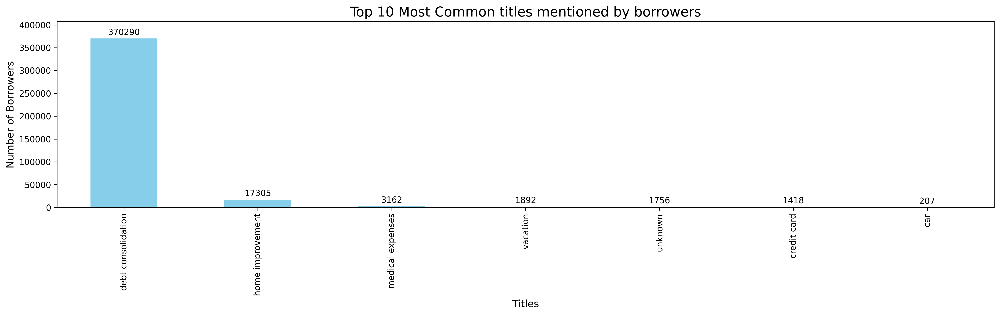

In [ ]:
title_counts = data['title_cleaned'].value_counts()
top_10_titles = title_counts.head(10)
plt.figure(figsize=(20,4))
title_counts.head(10).plot(kind='bar', color='skyblue')
plt.title("Top 10 Most Common titles mentioned by borrowers", fontsize=16)
plt.xlabel("Titles", fontsize=12)
plt.ylabel("Number of Borrowers", fontsize=12)
plt.ylim(0, top_10_titles.max() * 1.1)  # Add 10% buffer above the maximum value
for idx, value in enumerate(top_10_titles):
    plt.text(idx, value + top_10_titles.max() * 0.02, str(value), ha='center', fontsize=10)

In [ ]:
# Correlation between frequency-encoded column and target
correlation = data_encoded['title_cleaned'].corr(data_encoded['loan_status'])
print(f"Correlation with target: {correlation}")

Correlation with target: -0.005062927984524153


Shows weak relationship between title and loan_status. The relationship could be non linear.

## **Univariate Analysis**

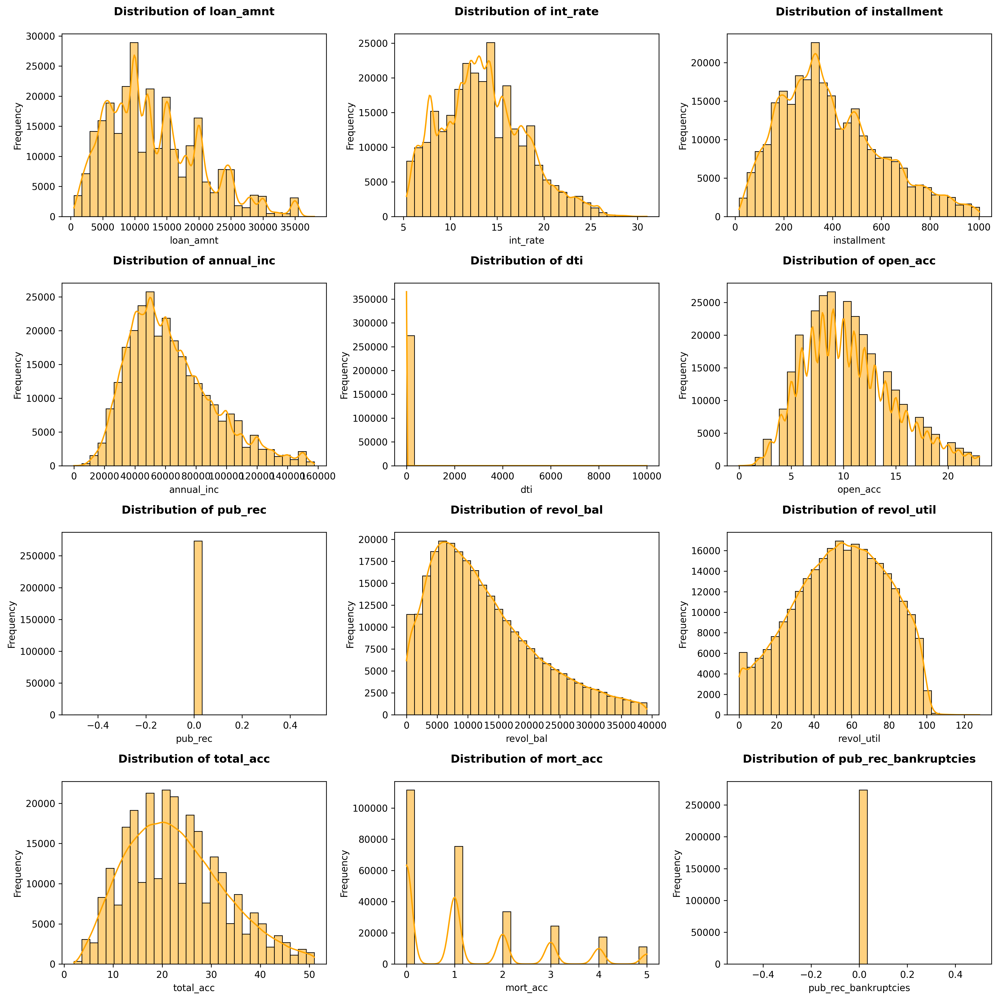

In [ ]:
sub_columns = ['loan_amnt', 'int_rate', 'installment', 'annual_inc', 'dti', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc', 'mort_acc', 'pub_rec_bankruptcies']
plt.figure(figsize=(15, 15))
for i, col in enumerate(sub_columns, 1):
    plt.subplot(4, 3, i)
    sns.histplot(data_encoded[col], kde=True, bins=30, color="orange", edgecolor="black")
    plt.title(f'Distribution of {col}', fontsize=12, pad=20, fontweight='bold')
    plt.xlabel(col)
    plt.ylabel('Frequency')
plt.tight_layout()

Features like loan_amnt, int_rate, and revol_bal show a right-skewed distribution.
Features such as mort_acc and pub_rec_bankruptcies have a significant proportion of zero values.

## **Loan Amount Vs other variables**

In [ ]:
sub_columns = ['int_rate', 'installment', 'annual_inc', 'dti', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc', 'mort_acc']
plt.figure(figsize=(20, 15))
for i, col in enumerate(sub_columns, 1):
    plt.subplot(4, 3, i)
    sns.scatterplot(x=col, y='loan_amnt', data=data_encoded, alpha=0.5, color="orange", edgecolor="w", marker="x")
    plt.title(f'{col} vs Loan Amount', fontsize=12, pad=20, fontweight='bold')
    plt.xlabel(col)
    plt.ylabel('Loan Amount')
plt.tight_layout()

## **Relationships Between Predictors and Target**

The visualizations highlight the distribution of loan statuses across various categorical variables. Visualisations are done on data that has Outliers removed


In [ ]:
def annotate_labels(ax, col, mapping_dictionaries, ordered_keys=None):
    """
    Annotate the x-axis of a plot with proper labels based on a mapping dictionary.
    Ensures correct ordering for categorical keys.

    Parameters:
    ax (matplotlib.axes.Axes): The axis object to annotate.
    col (str): The column name for which mapping is to be applied.
    mapping_dictionaries (dict): Dictionary containing the mappings for various columns.
    ordered_keys (list, optional): List of keys in the desired order for the x-axis.
    """
    if col in mapping_dictionaries:
        # Reverse the mapping dictionary
        reverse_mapping = {v: k.strip() for k, v in mapping_dictionaries[col].items()}

        if ordered_keys:
            # Ensure proper ordering if ordered_keys is provided
            ordered_labels = [reverse_mapping.get(k) for k in ordered_keys]
            ax.set_xticks(range(len(ordered_keys)))
            ax.set_xticklabels(ordered_labels, rotation=0, fontsize=10)
        else:
            # Default behavior for unordered mappings
            current_ticks = ax.get_xticks()  # Get current tick positions
            mapped_labels = [reverse_mapping.get(int(t), t) for t in current_ticks]
            ax.set_xticklabels(mapped_labels, rotation=0, fontsize=10)

    ax.tick_params(axis='y', labelsize=10)


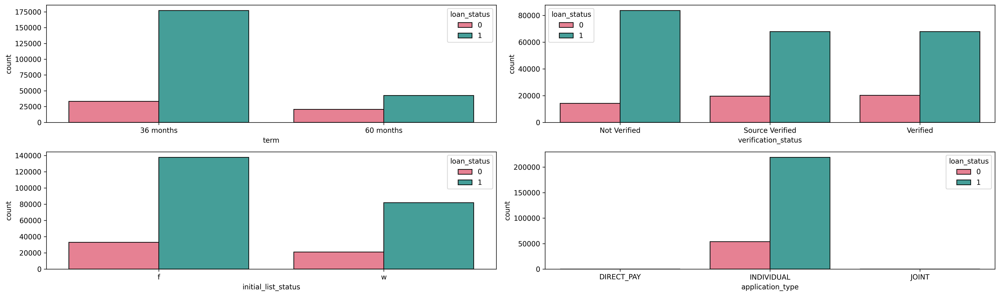

In [ ]:
sub_columns = ['term','verification_status', 'initial_list_status', 'application_type']
fig, axes = plt.subplots(2, 2, figsize=(20, 6))  # Adjust rows and columns as needed
axes = axes.flatten()  # Flatten the 2D grid into a 1D array for easy iteration
for i, col in enumerate(sub_columns):
    sns.countplot(data=data_encoded, x=col, hue='loan_status', palette='husl', ax=axes[i], edgecolor="black")
    annotate_labels(axes[i], col, mapping_dictionaries)
plt.tight_layout()

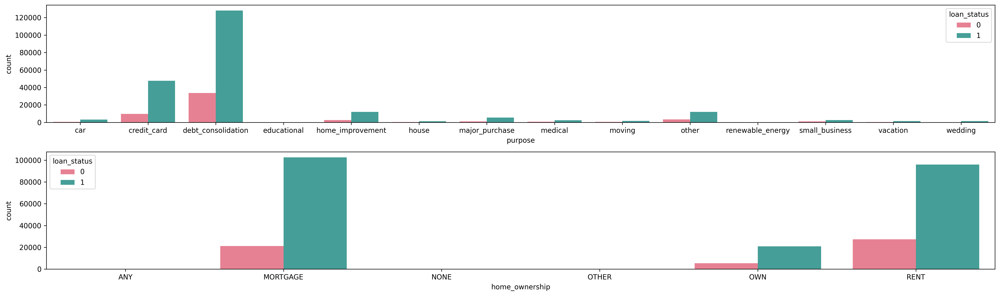

In [ ]:
sub_columns = ['purpose', 'home_ownership']

fig, axes = plt.subplots(2,1, figsize=(20, 6))  # Adjust rows and columns as needed
axes = axes.flatten()  # Flatten the 2D grid into a 1D array for easy iteration
for i, col in enumerate(sub_columns):
    sns.countplot(data=data_encoded, x=col, hue='loan_status', palette='husl', ax=axes[i])
    annotate_labels(axes[i], col, mapping_dictionaries)
plt.tight_layout()

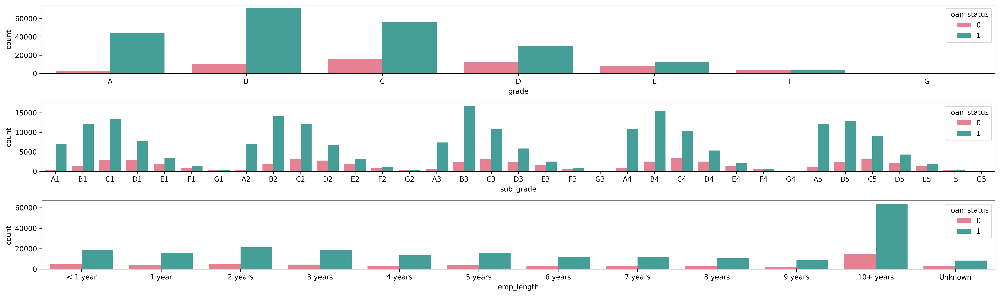

In [ ]:
sub_columns = ['grade', 'sub_grade', 'emp_length']

fig, axes = plt.subplots(3,1, figsize=(20, 6))  # Adjust rows and columns as needed
axes = axes.flatten()  # Flatten the 2D grid into a 1D array for easy iteration
for i, col in enumerate(sub_columns):
    sns.countplot(data=data_encoded, x=col, hue='loan_status', palette='husl', ax=axes[i])
    annotate_labels(axes[i], col, mapping_dictionaries)
plt.tight_layout()

- **Term:** Longer-term loans (60 months) tend to have a higher proportion of "Charged Off" loans compared to shorter-term loans (36 months).
- **Grade and Subgrade:** Lower grades (e.g., D, E, F) show a higher likelihood of loans being "Charged Off."
- **Home Ownership:** Borrowers with "RENT" status seem to have a slightly higher proportion of "Charged Off" loans.
- **Verification Status:** Loans with "Not Verified" incomes have a greater proportion of "Charged Off" statuses.
- **Purpose:** Certain loan purposes (e.g., "Small Business" or "Debt Consolidation") show higher default rates.
- **Application Type:** Most loans are "Individual," with some differences in default rates based on type.

## **Relationships between predictors and target using Boxplots**

In [ ]:
import math

# Define the columns to plot
numerical_columns = ['loan_amnt', 'int_rate', 'annual_inc', 'dti', 'revol_util']
encoded_columns = ['grade', 'sub_grade', 'emp_length', 'home_ownership',
                   'verification_status', 'purpose', 'initial_list_status']

# Combine numerical and encoded columns
all_columns = numerical_columns + encoded_columns + flagged_columns

# Dynamically calculate the grid size for subplots
n_cols = 3  # Number of columns in the grid
n_rows = math.ceil(len(all_columns) / n_cols)  # Calculate the required number of rows

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, n_rows * 5))
axes = axes.flatten()  # Flatten the grid for easy iteration

# Generate box plots for each column against loan_status
for i, col in enumerate(all_columns):
    sns.boxplot(data=data_encoded, x='loan_status', y=col, palette='husl', ax=axes[i])
    '''
    axes[i].set_title(f'{col} vs Loan Status', fontsize=14, pad=10, fontweight='bold')
    axes[i].set_xlabel('Loan Status', fontsize=12)
    axes[i].set_ylabel(col, fontsize=12)
    axes[i].tick_params(axis='x', labelrotation=45, labelsize=10)
    axes[i].tick_params(axis='y', labelsize=10)'''

# Remove any unused subplots
for j in range(len(all_columns), len(axes)):
    fig.delaxes(axes[j])

# Adjust layout and show the plot
plt.tight_layout()


The boxplots for selected numerical variables reveal the following:

- Loan Amount (loan_amnt): Charged-off loans tend to have slightly higher loan amounts than fully paid loans.
- Interest Rate (int_rate): Loans with higher interest rates are more likely to be charged off.
- Annual Income (annual_inc): Fully paid loans tend to have borrowers with higher annual incomes.
- Debt-to-Income Ratio (dti): Charged-off loans often have higher debt-to-income ratios.
- Revolving Utilization Rate (revol_util): Higher utilization rates are associated with a greater likelihood of loans being charged off.

**Key insights:**
    
**Loan Amount:** A small number of loans above $35,000 stand out as extreme outliers. Ignoring outliers, the median loan amount for Charged Off loans is slightly higher than Fully Paid loans. Higher loan amounts could increase the risk of default, suggesting stricter underwriting for larger loans.

**Interest Rate:** Outliers exist at high interest rates, particularly for Charged Off loans. Charged Off loans have consistently higher median interest rates compared to Fully Paid. High interest rates seem like a strong indicator of credit risk and default probability.

**Annual Income:** Extreme outliers (above $1M income) obscure the interpretation. Income distributions are similar for both Fully Paid and Charged Off. Income alone does not significantly differentiate between default and repayment. Combine with other metrics like DTI or int_rate.

**Debt-to-Income Ratio (dti):** Ignoring outliers, median DTI is higher for Charged Off loans, suggesting a risk factor. Borrowers with lower DTI should be considered to mitigate default risk.

**Revolving Utilization:** Extreme values exist but do not change the overall trend. Higher median utilization correlates with Charged Off loans. High utilization rates to be considered as a risk factor during underwriting.

**Grade and Sub-Grade:** Lower grades (higher risk) show a higher correlation with Charged Off loans.
**Purpose:** Most loan purposes cluster tightly, but certain categories (e.g., Debt Consolidation) appear more prone to default.
Lower grades and high-risk loan purposes to be considered for targeted risk management.

**Verification Status:** No significant difference is apparent between Fully Paid and Charged Off loans when outliers are included. Loans with Source Verified or Verified status have slightly higher variance and a higher median default rate than loans with Not Verified status. Verification adds a layer of scrutiny, but it doesn't strongly differentiate loan performance. Focus on improving the verification process to make it more predictive of repayment ability.

**Overall Business Recommendations:**

* **Pricing Adjustments:** Increase interest rate margins for high loan amounts, high DTI, and lower-grade loans.
* **Underwriting Standards:** Tighten approval criteria for borrowers with high DTI, high revol_util, and lower grades.
* **Risk Monitoring:** Use int_rate and grade as key predictors of default and prioritize monitoring for loans in these segments.


## **Checking correlation among independent variables**

How they interact with each other

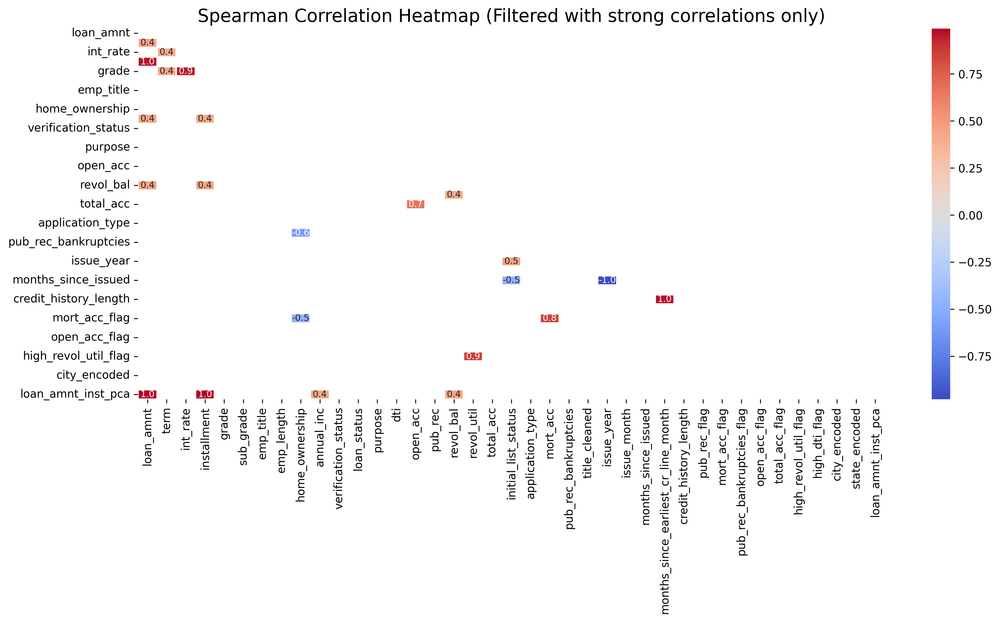

,Variable 1,Variable 2,Correlation
0,loan_amnt,loan_amnt_inst_pca,0.991249
3,installment,loan_amnt_inst_pca,0.990238
4,installment,loan_amnt,0.964408
7,credit_history_length,months_since_earliest_cr_line_month,0.962387
8,grade,int_rate,0.949867
15,open_acc,total_acc,0.655037
17,initial_list_status,issue_year,0.465123
19,loan_amnt,term,0.446999
20,loan_amnt_inst_pca,revol_bal,0.442914
22,loan_amnt,revol_bal,0.442131


In [ ]:
sub_columns = data_encoded.select_dtypes(include=['number']).columns

# Calculate Spearman correlation
spearman_corr = data_encoded[sub_columns].corr(method='spearman')

# --- Filter strong correlations ---
threshold = 0.4
spearman_strong_corr_matrix = spearman_corr[(spearman_corr >= threshold) | (spearman_corr <= -threshold)]

# Create a mask for the upper triangle
mask = np.triu(np.ones_like(spearman_strong_corr_matrix, dtype=bool))
sns.heatmap(spearman_strong_corr_matrix, mask=mask, annot=True, annot_kws={"size": 8}, fmt=".1f", cmap='coolwarm', linewidths=1.0)
plt.title('Spearman Correlation Heatmap (Filtered with strong correlations only)', fontsize=16)
plt.show()

correlation_pairs = spearman_strong_corr_matrix.unstack().sort_values(ascending=False)

# Drop self-correlations
correlation_pairs = correlation_pairs[correlation_pairs.index.get_level_values(0) != correlation_pairs.index.get_level_values(1)]

# Convert to a DataFrame
correlation_df = correlation_pairs.reset_index()
correlation_df.columns = ['Variable 1', 'Variable 2', 'Correlation']

flag_columns = [col for col in data_encoded.columns if '_flag' in col]  # Replace with actual pattern
correlation_df = correlation_df[
    ~(
        (correlation_df['Variable 1'].str.contains('_flag')) |
        (correlation_df['Variable 2'].str.contains('_flag'))
    )
]

# Filter to ignore one triangle (e.g., upper triangle)
correlation_df_filtered = correlation_df[correlation_df['Variable 1'] < correlation_df['Variable 2']]

correlation_df_filtered.head(30)

# **Split Train Test Data**

In [ ]:
data_for_model_columns = [col for col in data_encoded.columns if col not in ['state', 'city', 'earliest_cr_line', 'loan_amnt', 'installment', 'title_cleaned', 'issue_year', 'issue_month']]
data_for_model = data_encoded[data_for_model_columns]

In [ ]:
# Define features and target
X = data_for_model.drop(['loan_status'], axis=1)
y = data_for_model['loan_status']

In [ ]:
# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# Apply SMOTE to balance classes
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# **Feature Scaling: Using RobustScaler**

Since our data has many outliers, Robust Scaler is used. It uses the interquartile range (IQR) to scale features, making it less sensitive to outliers compared to methods like Min-Max or Standard Scaling. If the dataset contains features with skewed distributions, Robust Scaler helps normalize the scale without requiring transformations like log scaling.

In [ ]:
from sklearn.preprocessing import RobustScaler

exclude_columns = ['loan_amnt', 'installment']
columns_to_scale = [col for col in X_train_resampled.columns if col not in exclude_columns]
robustscaler = RobustScaler()
X_train_scaled = X_train_resampled.copy()
X_train_scaled[columns_to_scale] = robustscaler.fit_transform(X_train_resampled[columns_to_scale])

# Transform only the selected columns in the test set
X_test_scaled = X_test.copy()
X_test_scaled[columns_to_scale] = robustscaler.transform(X_test[columns_to_scale])

# Convert scaled data back to DataFrames
X_train_scaled_df = X_train_scaled
X_test_scaled_df = X_test_scaled

# Display the resulting scaled DataFrames
#print("Scaled Training Data (Sample):\n", X_train_scaled_df.head())
#print("Scaled Test Data (Sample):\n", X_test_scaled_df.head())


# **Feature Selection and Feature Importance**

### **1. Preparing Two DataFrames for 2 models**

To compare the performance of the two models and determine the 15 most impactful features using VIF and RFE

- Model 1: Remove flag columns (pub_rec_flag, mort_acc_flag, etc.) but retain their original source columns (pub_rec, mort_acc, etc.).
- Model 2: Keep only the flag columns and remove the original source columns.

In [ ]:
# Create DataFrames for Model 1 and Model 2
X_train_model1 = X_train_scaled_df.drop(columns= ['pub_rec_flag', 'mort_acc_flag', 'pub_rec_bankruptcies_flag', 'open_acc_flag', 'total_acc_flag', 'high_revol_util_flag', 'high_dti_flag'])
X_test_model1 = X_test_scaled_df.drop(columns=['pub_rec_flag', 'mort_acc_flag', 'pub_rec_bankruptcies_flag', 'open_acc_flag', 'total_acc_flag', 'high_revol_util_flag', 'high_dti_flag'])

X_train_model2 = X_train_scaled_df.drop(columns=['pub_rec', 'mort_acc', 'pub_rec_bankruptcies', 'open_acc', 'total_acc', 'dti'])
X_test_model2 = X_test_scaled_df.drop(columns=['pub_rec', 'mort_acc', 'pub_rec_bankruptcies', 'open_acc', 'total_acc', 'dti'])


### **2. Performing VIF Analysis**

Calculate Variance Inflation Factor (VIF) for both datasets and remove features with a VIF greater than a predefined threshold (e.g., 15). Checking colinearity

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
import pandas as pd

# Function to calculate VIF
def calculate_vif(data):
    vif_data = pd.DataFrame()
    vif_data["Feature"] = data.columns
    vif_data["VIF"] = [variance_inflation_factor(data.values, i) for i in range(data.shape[1])]
    return vif_data

# VIF for Model 1
vif_model1 = calculate_vif(X_train_model1)
vif_removed_features_model1 = vif_model1[vif_model1["VIF"] > 15]["Feature"].tolist()

# VIF for Model 2
vif_model2 = calculate_vif(X_train_model2)
vif_removed_features_model2 = vif_model2[vif_model2["VIF"] > 15]["Feature"].tolist()

print("VIF-Removed Features Model 1:", vif_removed_features_model1)
print("VIF-Removed Features Model 2:", vif_removed_features_model2)

VIF-Removed Features Model 1: ['months_since_issued', 'months_since_earliest_cr_line_month', 'credit_history_length']
VIF-Removed Features Model 2: ['months_since_issued', 'months_since_earliest_cr_line_month', 'credit_history_length']


### **3. Performing Recursive Feature Elimination (RFE)**

Run RFE for both models and select the top 15 features that impact the predictive power

In [ ]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

# RFE for Model 1
rfe_model1 = RFE(estimator=LogisticRegression(class_weight='balanced', random_state=42, solver='liblinear'), n_features_to_select=20)
rfe_model1.fit(X_train_model1, y_train_resampled)
rfe_selected_features_model1 = X_train_model1.columns[rfe_model1.support_]

# RFE for Model 2
rfe_model2 = RFE(estimator=LogisticRegression(class_weight='balanced', random_state=42, solver='liblinear'), n_features_to_select=20)
rfe_model2.fit(X_train_model2, y_train_resampled)
rfe_selected_features_model2 = X_train_model2.columns[rfe_model2.support_]

print("RFE-Selected Features Model 1:", rfe_selected_features_model1)
print("RFE-Selected Features Model 2:", rfe_selected_features_model2)

RFE-Selected Features Model 1: Index(['int_rate', 'grade', 'sub_grade', 'emp_title', 'emp_length',
       'home_ownership', 'annual_inc', 'verification_status', 'dti',
       'revol_bal', 'revol_util', 'total_acc', 'initial_list_status',
       'application_type', 'mort_acc', 'months_since_issued',
       'months_since_earliest_cr_line_month', 'credit_history_length',
       'city_encoded', 'loan_amnt_inst_pca'],
      dtype='object')
RFE-Selected Features Model 2: Index(['int_rate', 'grade', 'sub_grade', 'emp_title', 'emp_length',
       'home_ownership', 'annual_inc', 'verification_status', 'revol_util',
       'initial_list_status', 'application_type', 'months_since_issued',
       'months_since_earliest_cr_line_month', 'credit_history_length',
       'mort_acc_flag', 'open_acc_flag', 'high_revol_util_flag',
       'high_dti_flag', 'city_encoded', 'loan_amnt_inst_pca'],
      dtype='object')


### **4. Compare VIF and RFE Results**

Identify features common to VIF-removed and RFE-selected features for both models and retain only features that are confirmed by both analysis

In [ ]:
# For Model 1
# Step 1: Find common features between RFE-selected and VIF-removed features for Model 1
common_features_model1 = list(set(rfe_selected_features_model1) & set(vif_removed_features_model1))

# Step 2: Retain only features in rfe_selected_features_model1 and common_features_model1
final_features_model1 = list(set(rfe_selected_features_model1) | set(common_features_model1))

# Filter the datasets for Model 1
X_train_model1 = X_train_model1[final_features_model1]
X_test_model1 = X_test_model1[final_features_model1]

print("Final Features for Model 1:", final_features_model1)

# For Model 2
# Step 1: Find common features between RFE-selected and VIF-removed features for Model 2
common_features_model2 = list(set(rfe_selected_features_model2) & set(vif_removed_features_model2))

# Step 2: Retain only features in rfe_selected_features_model2 and common_features_model2
final_features_model2 = list(set(rfe_selected_features_model2) | set(common_features_model2))

# Filter the datasets for Model 2
X_train_model2 = X_train_model2[final_features_model2]
X_test_model2 = X_test_model2[final_features_model2]

print("Final Features for Model 2:", final_features_model2)

Final Features for Model 1: ['grade', 'application_type', 'total_acc', 'annual_inc', 'loan_amnt_inst_pca', 'city_encoded', 'dti', 'emp_length', 'verification_status', 'emp_title', 'initial_list_status', 'revol_bal', 'sub_grade', 'home_ownership', 'mort_acc', 'months_since_earliest_cr_line_month', 'months_since_issued', 'int_rate', 'revol_util', 'credit_history_length']
Final Features for Model 2: ['grade', 'application_type', 'annual_inc', 'high_revol_util_flag', 'loan_amnt_inst_pca', 'open_acc_flag', 'high_dti_flag', 'mort_acc_flag', 'city_encoded', 'emp_length', 'verification_status', 'emp_title', 'initial_list_status', 'sub_grade', 'home_ownership', 'months_since_earliest_cr_line_month', 'months_since_issued', 'int_rate', 'revol_util', 'credit_history_length']


# **Model Building: Training Logistic Regression Models**

Train logistic regression models for both datasets using the selected features.

In [ ]:
from sklearn.metrics import accuracy_score

# Train Model 1
X_train_model1_final = X_train_model1[final_features_model1]
X_test_model1_final = X_test_model1[final_features_model1]

model1 = LogisticRegression(C=0.1, penalty='l2', class_weight='balanced', random_state=42)
model1.fit(X_train_model1_final, y_train_resampled)
y_pred_model1 = model1.predict(X_test_model1_final)
accuracy_model1 = accuracy_score(y_test, y_pred_model1)
print(f"Model 1 Accuracy: {accuracy_model1:.2f}")

# Train Model 2
X_train_model2_final = X_train_model2[final_features_model2]
X_test_model2_final = X_test_model2[final_features_model2]

model2 = LogisticRegression(C=0.1, penalty='l2', class_weight='balanced', random_state=42)
model2.fit(X_train_model2_final, y_train_resampled)
y_pred_model2 = model2.predict(X_test_model2_final)
accuracy_model2 = accuracy_score(y_test, y_pred_model2)
print(f"Model 2 Accuracy: {accuracy_model2:.2f}")

Model 1 Accuracy: 0.77
Model 2 Accuracy: 0.77


# **Evaluating models for performance**

1. Accuracy Score
2. Classification Report: Displays precision, recall, f1-score, and support for each class.
3. Confusion Matrix: Shows true positives, true negatives, false positives, and false negatives.
4. ROC AUC Score: Indicates the area under the ROC curve, measuring the model's ability to distinguish between positive and negative classes.
5. ROC Curve: Plots the true positive rate (sensitivity) against the false positive rate, showing the trade-off for various thresholds.
6. Precision Recall Curve: illustrates the balance between precision and recall across different thresholds.
7. Optimal Balance for trade off threshold

## **Generating Classification Report, Confusion Matrix, ROC AUC Score**

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve, PrecisionRecallDisplay
import matplotlib.pyplot as plt

# Evaluate Model 1
print("---- Model 1 Evaluation ----")
# Generate predictions and probabilities
y_pred_model1 = model1.predict(X_test_model1)
y_prob_model1 = model1.predict_proba(X_test_model1)[:, 1]

# Accuracy score
accuracy_model1 = accuracy_score(y_test, y_pred_model1)
print(f"\n1. Accuracy Score: {accuracy_model1:.2f}")

# Classification report
print("\n2. Classification Report:")
print(classification_report(y_test, y_pred_model1))

# Confusion matrix
print("\n3. Confusion Matrix:")
conf_matrix_model1 = confusion_matrix(y_test, y_pred_model1)
print(conf_matrix_model1)

# ROC AUC score
roc_auc_model1 = roc_auc_score(y_test, y_prob_model1)
print(f"\n4. ROC AUC Score: {roc_auc_model1:.2f}")

# Evaluate Model 2
print("\n---- Model 2 Evaluation ----")
# Generate predictions and probabilities
y_pred_model2 = model2.predict(X_test_model2)
y_prob_model2 = model2.predict_proba(X_test_model2)[:, 1]

# Accuracy score
accuracy_model2 = accuracy_score(y_test, y_pred_model2)
print(f"\n1. Accuracy Score: {accuracy_model2:.2f}")

# Classification report
print(f"\n2. Classification Report:")
print(classification_report(y_test, y_pred_model2))

# Confusion matrix
print(f"\n3. Confusion Matrix:")
conf_matrix_model2 = confusion_matrix(y_test, y_pred_model2)
print(conf_matrix_model2)

# ROC AUC score
roc_auc_model2 = roc_auc_score(y_test, y_prob_model2)
print(f"\n4. ROC AUC Score: {roc_auc_model2:.2f}")

---- Model 1 Evaluation ----

1. Accuracy Score: 0.77

2. Classification Report:
              precision    recall  f1-score   support

           0       0.44      0.60      0.51     10898
           1       0.89      0.81      0.85     43795

    accuracy                           0.77     54693
   macro avg       0.66      0.70      0.68     54693
weighted avg       0.80      0.77      0.78     54693


3. Confusion Matrix:
[[ 6521  4377]
 [ 8358 35437]]

4. ROC AUC Score: 0.80

---- Model 2 Evaluation ----

1. Accuracy Score: 0.77

2. Classification Report:
              precision    recall  f1-score   support

           0       0.45      0.57      0.50     10898
           1       0.88      0.82      0.85     43795

    accuracy                           0.77     54693
   macro avg       0.67      0.70      0.68     54693
weighted avg       0.80      0.77      0.78     54693


3. Confusion Matrix:
[[ 6182  4716]
 [ 7690 36105]]

4. ROC AUC Score: 0.79


### Summary

- **Positive Class (`Fully Paid`)**:
  - **Recall > Precision** (0.96 > 0.82)
  - The model captures most reliable borrowers but approves some risky ones.

- **Negative Class (`Charged Off`)**:
  - **Precision > Recall** (0.45 > 0.12)
  - The model is confident in identifying defaulters but misses most of them.

- **Overall**:
  - The model prioritizes approving reliable borrowers but struggles to detect defaulters, increasing default risks.


## **Plotting ROC Curve**

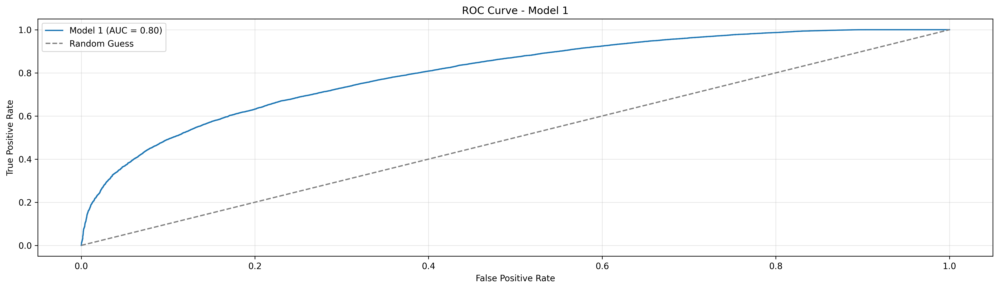

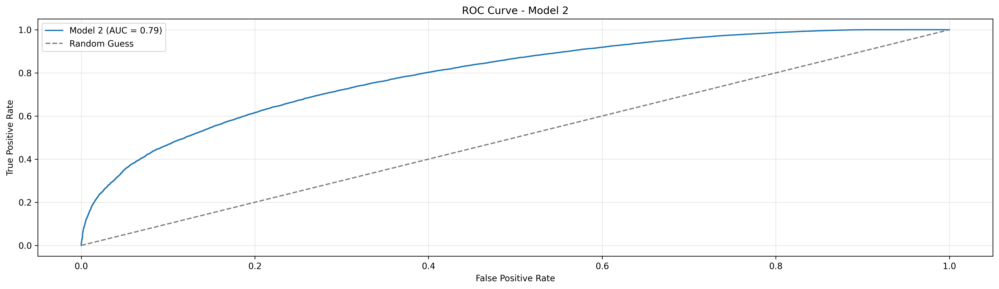

In [ ]:
from sklearn.metrics import roc_curve
import matplotlib.pyplot as plt

# Plot ROC Curve for Model 1
fpr1, tpr1, _ = roc_curve(y_test, y_prob_model1)
plt.figure(figsize=(20, 5))
plt.plot(fpr1, tpr1, label=f"Model 1 (AUC = {roc_auc_model1:.2f})")
plt.plot([0, 1], [0, 1], linestyle="--", color="gray", label="Random Guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Model 1")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

# Plot ROC Curve for Model 2
fpr2, tpr2, _ = roc_curve(y_test, y_prob_model2)
plt.figure(figsize=(20, 5))
plt.plot(fpr2, tpr2, label=f"Model 2 (AUC = {roc_auc_model2:.2f})")
plt.plot([0, 1], [0, 1], linestyle="--", color="gray", label="Random Guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Model 2")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

## **Precision-Recall Tradeoff**

Plot the tradeoff between precision and recall across thresholds for both models.

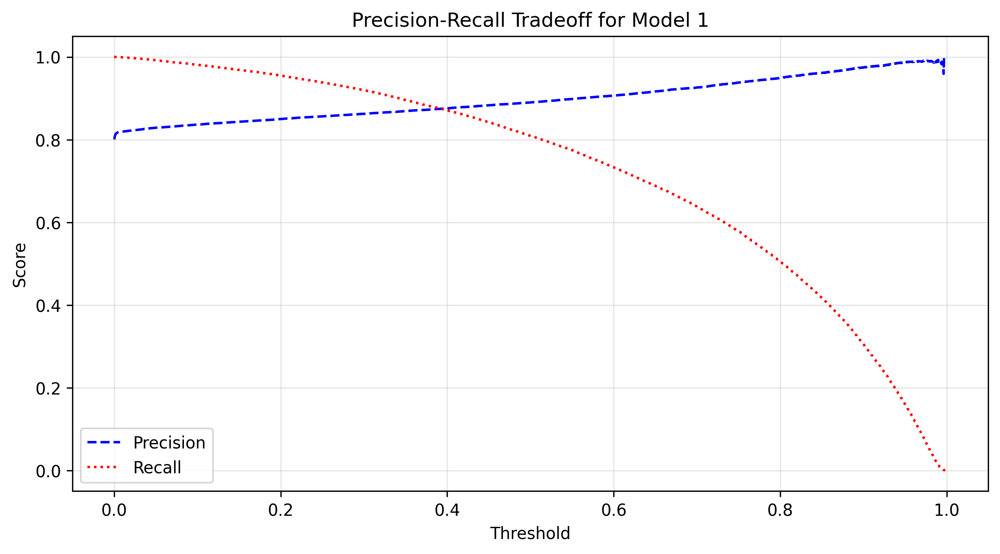

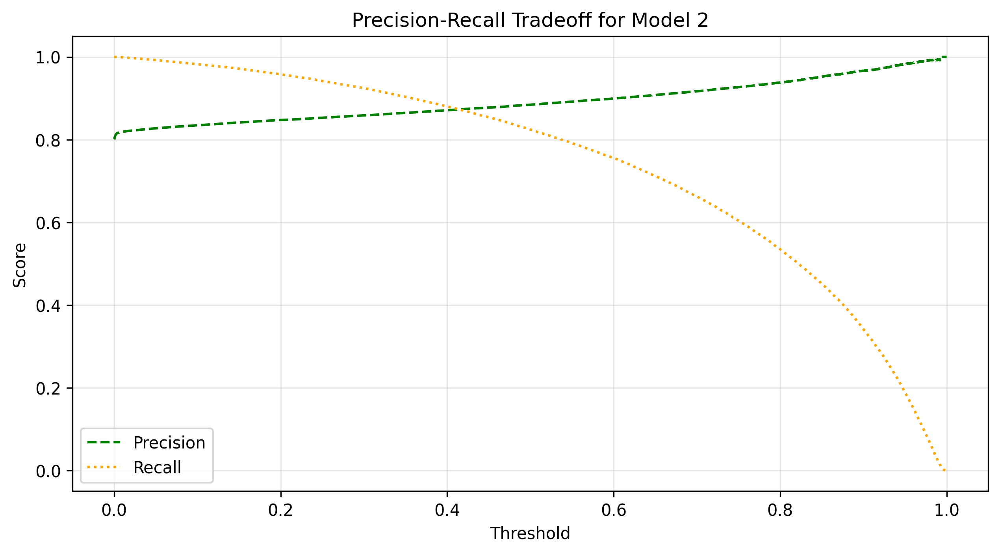

In [ ]:
from sklearn.metrics import precision_recall_curve, auc

# Plot Precision-Recall Tradeoff for Model 1
precision1, recall1, thresholds1 = precision_recall_curve(y_test, y_prob_model1)
pr_auc_model1 = auc(recall1, precision1)

plt.figure(figsize=(10, 5))
plt.plot(thresholds1, precision1[:-1], label="Precision", linestyle="--", color="blue")
plt.plot(thresholds1, recall1[:-1], label="Recall", linestyle=":", color="red")
plt.xlabel("Threshold")
plt.ylabel("Score")
plt.title("Precision-Recall Tradeoff for Model 1")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

# Plot Precision-Recall Tradeoff for Model 2
precision2, recall2, thresholds2 = precision_recall_curve(y_test, y_prob_model2)
pr_auc_model2 = auc(recall2, precision2)

plt.figure(figsize=(10, 5))
plt.plot(thresholds2, precision2[:-1], label="Precision", linestyle="--", color="green")
plt.plot(thresholds2, recall2[:-1], label="Recall", linestyle=":", color="orange")
plt.xlabel("Threshold")
plt.ylabel("Score")
plt.title("Precision-Recall Tradeoff for Model 2")
plt.legend()
plt.grid(alpha=0.3)
plt.show()


## **Precision Recall tradeoff and optimal balance threshold**

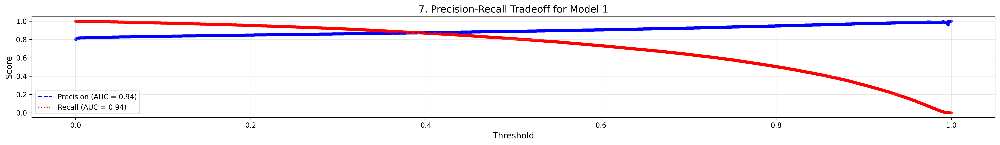

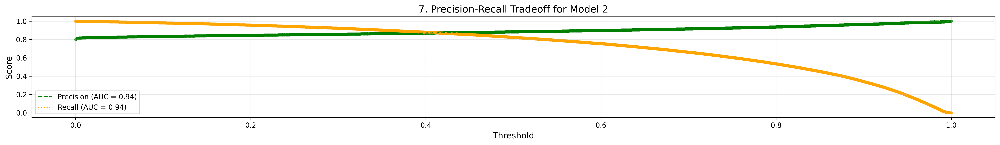

In [ ]:
from sklearn.metrics import auc
import matplotlib.pyplot as plt

# Precision-Recall Curve for Model 1
precision1, recall1, thresholds1 = precision_recall_curve(y_test, y_prob_model1)
pr_auc_model1 = auc(recall1, precision1)

plt.figure(figsize=(20, 3))
plt.plot(thresholds1, precision1[:-1], label=f"Precision (AUC = {pr_auc_model1:.2f})", linestyle="--", color="blue")
plt.plot(thresholds1, recall1[:-1], label=f"Recall (AUC = {pr_auc_model1:.2f})", linestyle=":", color="red")
plt.scatter(thresholds1, precision1[:-1], s=10, color="blue", alpha=0.5)
plt.scatter(thresholds1, recall1[:-1], s=10, color="red", alpha=0.5)
plt.xlabel("Threshold", fontsize=12)
plt.ylabel("Score", fontsize=12)
plt.title("7. Precision-Recall Tradeoff for Model 1", fontsize=14)
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# Precision-Recall Curve for Model 2
precision2, recall2, thresholds2 = precision_recall_curve(y_test, y_prob_model2)
pr_auc_model2 = auc(recall2, precision2)

plt.figure(figsize=(20, 3))
plt.plot(thresholds2, precision2[:-1], label=f"Precision (AUC = {pr_auc_model2:.2f})", linestyle="--", color="green")
plt.plot(thresholds2, recall2[:-1], label=f"Recall (AUC = {pr_auc_model2:.2f})", linestyle=":", color="orange")
plt.scatter(thresholds2, precision2[:-1], s=10, color="green", alpha=0.5)
plt.scatter(thresholds2, recall2[:-1], s=10, color="orange", alpha=0.5)
plt.xlabel("Threshold", fontsize=12)
plt.ylabel("Score", fontsize=12)
plt.title("7. Precision-Recall Tradeoff for Model 2", fontsize=14)
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


## **Find Optimal Threshold**

Identify the threshold that maximizes the F1 score for each model.

In [ ]:
# Optimal Threshold for Model 1
f1_scores1 = 2 * (precision1 * recall1) / (precision1 + recall1)
best_idx1 = np.argmax(f1_scores1)
best_threshold1 = thresholds1[best_idx1]
print(f"Optimal Threshold for Model 1: {best_threshold1:.2f}")
print(f"Precision at Optimal Threshold: {precision1[best_idx1]:.2f}")
print(f"Recall at Optimal Threshold: {recall1[best_idx1]:.2f}")

# Optimal Threshold for Model 2
f1_scores2 = 2 * (precision2 * recall2) / (precision2 + recall2)
best_idx2 = np.argmax(f1_scores2)
best_threshold2 = thresholds2[best_idx2]
print(f"Optimal Threshold for Model 2: {best_threshold2:.2f}")
print(f"Precision at Optimal Threshold: {precision2[best_idx2]:.2f}")
print(f"Recall at Optimal Threshold: {recall2[best_idx2]:.2f}")


Optimal Threshold for Model 1: 0.05
Precision at Optimal Threshold: 0.83
Recall at Optimal Threshold: 0.99
Optimal Threshold for Model 2: 0.08
Precision at Optimal Threshold: 0.83
Recall at Optimal Threshold: 0.99


**Precision-Recall Tradeoff:**
- Higher thresholds improve Precision (fewer false positives) but lower Recall (miss more creditworthy borrowers).
- Lower thresholds improve Recall (identify more creditworthy borrowers) but - reduce Precision (riskier loans approved).

**Performance:**
AUC = 0.89 indicates strong model performance in balancing precision and recall.

**Business Implication:**
Choose a threshold based on priorities:
- Higher Precision: Minimize defaults (play safe).
- Higher Recall: Maximize loan approvals (expand lending opportunities).

## **Listing Logistic Regression Coefficients**

In logistic regression, the coefficients represent the impact of each feature on the log-odds of the target outcome

In [ ]:
print("MODEL 1")
print("\n\nNumber of Features in X:", X_train_model1.shape[1])
print("Number of Coefficients in Model 1:", len(model1.coef_[0]))
print(X_train_model1.columns)

print("MODEL 2")
print("\nNumber of Features in X:", X_train_model2.shape[1])
print("Number of Coefficients in Model 2:", len(model2.coef_[0]))
print(X_train_model2.columns)

MODEL 1


Number of Features in X: 20
Number of Coefficients in Model 1: 20
Index(['grade', 'application_type', 'total_acc', 'annual_inc',
       'loan_amnt_inst_pca', 'city_encoded', 'dti', 'emp_length',
       'verification_status', 'emp_title', 'initial_list_status', 'revol_bal',
       'sub_grade', 'home_ownership', 'mort_acc',
       'months_since_earliest_cr_line_month', 'months_since_issued',
       'int_rate', 'revol_util', 'credit_history_length'],
      dtype='object')
MODEL 2

Number of Features in X: 20
Number of Coefficients in Model 2: 20
Index(['grade', 'application_type', 'annual_inc', 'high_revol_util_flag',
       'loan_amnt_inst_pca', 'open_acc_flag', 'high_dti_flag', 'mort_acc_flag',
       'city_encoded', 'emp_length', 'verification_status', 'emp_title',
       'initial_list_status', 'sub_grade', 'home_ownership',
       'months_since_earliest_cr_line_month', 'months_since_issued',
       'int_rate', 'revol_util', 'credit_history_length'],
      dtype='object')


## **Interpreting Feature Importance using coefficients**

Identifying the most impactful features based on logistic regression coefficients.

In [ ]:
# Model 1 Coefficients
coef_model1 = model1.coef_[0]
coef_df_model1 = pd.DataFrame({'Feature': X_train_model1_final.columns, 'Coefficient': coef_model1})
coef_df_model1['Abs_Coefficient'] = coef_df_model1['Coefficient'].abs()
coef_df_model1 = coef_df_model1.sort_values(by='Abs_Coefficient', ascending=False)
print("Top 10 Impactful Features for Model 1:")
print(coef_df_model1.head(10))

# Calculate and sort odds ratios
coef_df_model1['Odds_Ratio'] = np.exp(coef_df_model1['Coefficient'])
print("Top Features by Odds Ratio:")
print(coef_df_model1.sort_values(by='Odds_Ratio', ascending=False).head(10))

# Model 2 Coefficients
coef_model2 = model2.coef_[0]
coef_df_model2 = pd.DataFrame({'Feature': X_train_model2_final.columns, 'Coefficient': coef_model2})
coef_df_model2['Abs_Coefficient'] = coef_df_model2['Coefficient'].abs()
coef_df_model2 = coef_df_model2.sort_values(by='Abs_Coefficient', ascending=False)
print("Top 20 Impactful Features for Model 2:")
print(coef_df_model2.head(10))

# Calculate and sort odds ratios
coef_df_model2['Odds_Ratio'] = np.exp(coef_df_model2['Coefficient'])
print("Top Features by Odds Ratio:")
print(coef_df_model2.sort_values(by='Odds_Ratio', ascending=False).head(10))


Top 10 Impactful Features for Model 1:
                Feature  Coefficient  Abs_Coefficient
17             int_rate    -3.565326         3.565326
0                 grade     3.224837         3.224837
5          city_encoded     1.609183         1.609183
10  initial_list_status     0.808269         0.808269
12            sub_grade     0.668080         0.668080
8   verification_status     0.618728         0.618728
16  months_since_issued     0.517527         0.517527
4    loan_amnt_inst_pca    -0.360902         0.360902
6                   dti    -0.287678         0.287678
9             emp_title    -0.221233         0.221233
Top Features by Odds Ratio:
                Feature  Coefficient  Abs_Coefficient  Odds_Ratio
0                 grade     3.224837         3.224837   25.149479
5          city_encoded     1.609183         1.609183    4.998725
10  initial_list_status     0.808269         0.808269    2.244021
12            sub_grade     0.668080         0.668080    1.950489
8   verif

## **Visualising Feature Importance**

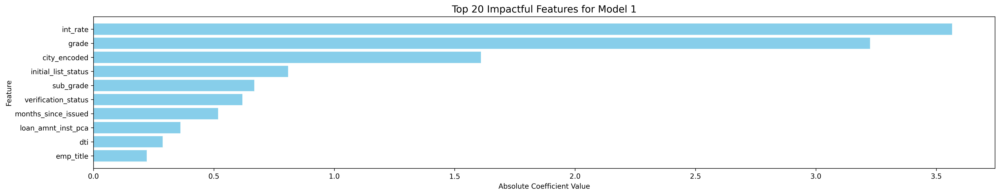

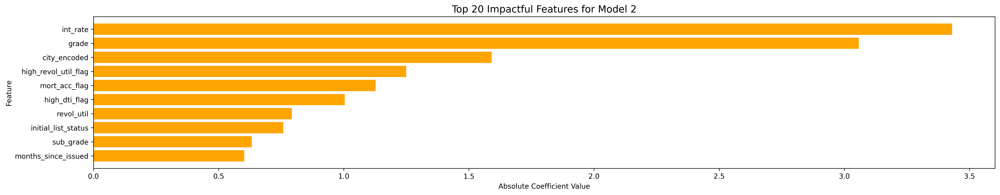

In [ ]:
import matplotlib.pyplot as plt

# Plot for Model 1
plt.figure(figsize=(20, 4))
plt.barh(coef_df_model1['Feature'].head(10), coef_df_model1['Abs_Coefficient'].head(10), color='skyblue')
plt.xlabel("Absolute Coefficient Value")
plt.ylabel("Feature")
plt.title("Top 20 Impactful Features for Model 1", fontsize=14)
plt.gca().invert_yaxis()  # Invert y-axis to display the most impactful feature at the top
plt.tight_layout()
plt.show()

# Plot for Model 2
plt.figure(figsize=(20, 4))
plt.barh(coef_df_model2['Feature'].head(10), coef_df_model2['Abs_Coefficient'].head(10), color='orange')
plt.xlabel("Absolute Coefficient Value")
plt.ylabel("Feature")
plt.title("Top 20 Impactful Features for Model 2", fontsize=14)
plt.gca().invert_yaxis()  # Invert y-axis to display the most impactful feature at the top
plt.tight_layout()
plt.show()

# **Analysis of the Model's Metrics and Their Impact**

## Key Observations

### Class Imbalance:
- **Positive class (1: Fully Paid)** dominates with **80.3% (63629/79206)**, and the negative class (0: Charged Off) is underrepresented.

### Precision and Recall Gap:
- **For the negative class (0)**:
  - **Precision = 0.45**: Many borrowers predicted as defaulters are actually reliable.
  - **Recall = 0.12**: The model captures only 12% of actual defaulters.
  - **Impact**: The bank misses identifying most defaulters, leading to high **false negatives**, which increases loan defaults and NPAs.

- **For the positive class (1)**:
  - **Precision = 0.82**: Most borrowers predicted as reliable are genuinely reliable.
  - **Recall = 0.96**: Nearly all reliable borrowers are identified.
  - **Impact**: The bank captures most reliable borrowers, ensuring high loan approval and revenue generation.

### Confusion Matrix Insights:
- **False Positives (13649)**: Risky borrowers are incorrectly classified as reliable, increasing default risk.
- **False Negatives (2371)**: Reliable borrowers are denied loans, leading to missed revenue opportunities.

---

## Impact on the Bank

### High Recall for Reliable Borrowers (Class 1):
- **Positive**:
  - The bank approves loans for nearly all creditworthy borrowers, maximizing revenue potential.
- **Negative**:
  - Approving some risky borrowers (**false positives**) increases default risk and NPAs.

### Low Recall for Defaulters (Class 0):
- **Negative**:
  - The bank fails to identify 88% of defaulters, leading to a high rate of defaults and financial losses.
  - Risk assessment is weak, impacting overall portfolio quality.

### ROC AUC (0.68):
- Indicates moderate discrimination between defaulters and reliable borrowers.
- The model struggles to separate risky and reliable borrowers effectively.

---

## How the Gap Affects the Bank

### Revenue Opportunity:
- High recall for reliable borrowers ensures good revenue through loan approvals.
- However, **false negatives** (missed defaulters) represent a significant risk to financial stability.

### Default Risk:
- The large gap between precision and recall for defaulters (class 0) leaves the bank vulnerable to high default rates, increasing NPAs.

---

## Recommendations

### Focus on Defaulters (Class 0):
- Improve **recall for defaulters** to reduce false negatives and strengthen risk management.
- Adjust the threshold or use cost-sensitive learning to focus on identifying more defaulters.

### Balance Precision and Recall:
- For reliable borrowers (class 1), maintain **high recall** but monitor precision to avoid false positives.

### Improve Model Discrimination:
- Enhance **ROC AUC** by improving feature engineering or exploring more advanced models like ensemble methods.

---

By addressing these issues, the bank can achieve a better balance between revenue growth and risk management.


# **Model Building: Random Forest**

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score

# Random Forest for Model 1
rf_model1 = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
rf_model1.fit(X_train_model1_final, y_train_resampled)

# Predictions for Model 1
y_pred_rf_model1 = rf_model1.predict(X_test_model1_final)
y_prob_rf_model1 = rf_model1.predict_proba(X_test_model1_final)[:, 1]

# Evaluate Model 1
print("---- Random Forest Model 1 Evaluation ----")
accuracy_rf_model1 = accuracy_score(y_test, y_pred_rf_model1)
print(f"Accuracy: {accuracy_rf_model1:.2f}")
print("Classification Report:")
print(classification_report(y_test, y_pred_rf_model1))
roc_auc_rf_model1 = roc_auc_score(y_test, y_prob_rf_model1)
print(f"ROC AUC Score: {roc_auc_rf_model1:.2f}")

# Random Forest for Model 2
rf_model2 = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
rf_model2.fit(X_train_model2_final, y_train_resampled)

# Predictions for Model 2
y_pred_rf_model2 = rf_model2.predict(X_test_model2_final)
y_prob_rf_model2 = rf_model2.predict_proba(X_test_model2_final)[:, 1]

# Evaluate Model 2
print("\n---- Random Forest Model 2 Evaluation ----")
accuracy_rf_model2 = accuracy_score(y_test, y_pred_rf_model2)
print(f"Accuracy: {accuracy_rf_model2:.2f}")
print("Classification Report:")
print(classification_report(y_test, y_pred_rf_model2))
roc_auc_rf_model2 = roc_auc_score(y_test, y_prob_rf_model2)
print(f"ROC AUC Score: {roc_auc_rf_model2:.2f}")


---- Random Forest Model 1 Evaluation ----
Accuracy: 0.82
Classification Report:
              precision    recall  f1-score   support

           0       0.56      0.50      0.53     10898
           1       0.88      0.90      0.89     43795

    accuracy                           0.82     54693
   macro avg       0.72      0.70      0.71     54693
weighted avg       0.82      0.82      0.82     54693

ROC AUC Score: 0.84

---- Random Forest Model 2 Evaluation ----
Accuracy: 0.82
Classification Report:
              precision    recall  f1-score   support

           0       0.54      0.51      0.52     10898
           1       0.88      0.89      0.89     43795

    accuracy                           0.82     54693
   macro avg       0.71      0.70      0.71     54693
weighted avg       0.81      0.82      0.81     54693

ROC AUC Score: 0.84




---



# **Business Questions and Insights**

## **What percentage of customers have fully paid their Loan Amount?**

Text(0, 0.5, 'Number of Customers')

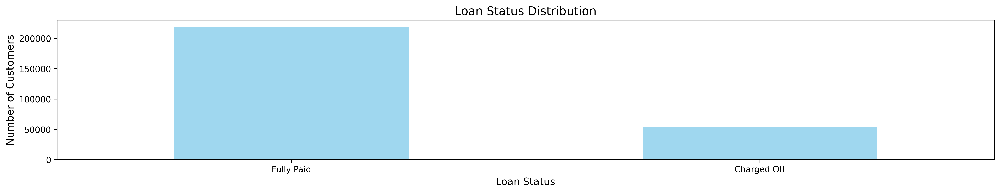

In [ ]:
reverse_loan_status_mapping = {v: k for k, v in mapping_dictionaries['loan_status'].items()}
status_counts = data_encoded['loan_status'].value_counts()
status_percentages = (status_counts / len(data)) * 100
plt.figure(figsize=(20, 3))
status_counts.plot(kind='bar', color='skyblue', alpha=0.8)
#for i, count in enumerate(status_counts):
    #plt.text(i, count, f"{status_percentages[i]:.2f}%", ha='center', va='bottom', fontsize=10)
plt.xticks(ticks=range(len(status_counts)), labels=status_counts.index.map(reverse_loan_status_mapping), rotation=0)
plt.title("Loan Status Distribution", fontsize=14)
plt.xlabel("Loan Status", fontsize=12)
plt.ylabel("Number of Customers", fontsize=12)

**Insights**

- **Customer Behavior:** A high percentage of customers who have fully paid their loans (e.g., 80.37%) indicates that the majority of borrowers are reliable and fulfill their repayment obligations. This reflects positively on the lending institution's screening and risk assessment process.
Loan Default Risk: The complementary percentage (e.g., 19.63%) represents customers who defaulted (e.g., Charged Off loans). This provides insight into the non-performing asset (NPA) rate, which is critical for financial risk management.

- **Implications for Lending Policies:** If the Fully Paid percentage is very high, the company might consider slightly relaxing credit eligibility criteria to approve more loans, potentially increasing revenue.

- **Class Imbalance:** A high percentage of Fully Paid loans suggests class imbalance in the dataset. This imbalance has been addressed during model building using class weighting.

- **Revenue Opportunity:** Fully paid loans represent potential revenue opportunities from interest payments. Understanding the profile of Fully Paid customers can help in designing targeted marketing campaigns to attract similar borrowers.

**Recommendations**

- **Improve Default Prevention:** Analyze defaulter profiles and enhance credit scoring models.

- **Customer Segmentation:** Use insights to design loyalty programs or preferential rates for reliable borrowers.

- **Address Class Imbalance:** Apply techniques like oversampling, undersampling, or class weighting in predictive models.

- **Evaluate Lending Risk:** Benchmark Fully Paid rates against industry standards to refine lending policies.



---



## **Comment about the correlation between Loan Amount and Installment features.**


In [ ]:
# Pearson Correlation
correlation = data_encoded['loan_amnt'].corr(data_encoded['installment'])
print(f"Pearson Correlation between Loan Amount and Installment: {correlation:.2f}")

# Spearman correlation
from scipy.stats import spearmanr
spearman_corr, _ = spearmanr(data['loan_amnt'], data['installment'])
print(f"Spearman Correlation between Loan Amount and Installment: {spearman_corr:.2f}")

Pearson Correlation between Loan Amount and Installment: 0.95
Spearman Correlation between Loan Amount and Installment: 0.97


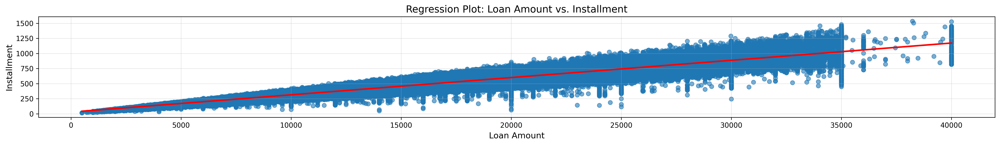

In [ ]:
import seaborn as sns
plt.figure(figsize=(20, 3))
sns.regplot(x='loan_amnt', y='installment', data=data, scatter_kws={'alpha': 0.6}, line_kws={'color': 'red'})
plt.title("Regression Plot: Loan Amount vs. Installment", fontsize=14)
plt.xlabel("Loan Amount", fontsize=12)
plt.ylabel("Installment", fontsize=12)
plt.grid(alpha=0.3)
plt.tight_layout()

**Insights**

- **Strong Positive Correlation Expected:**
Installments are directly proportional to the loan amount, so we expect a strong positive correlation. This relationship is a natural result of how installment calculations are typically structured in lending. The small difference between Pearson (0.95) and Spearman (0.97) suggests:
The relationship is both linear and monotonic.
Outliers, non-linear patterns, or rank inversions are negligible.

- **Interpretation for Business:**
A high correlation confirms that higher loan amounts lead to higher monthly obligations, which may impact a borrower's repayment capacity.
Loan underwriting models should incorporate these relationships to better assess borrower affordability and risk.




---



## **The majority of people have home ownership as ___.**


Text(0, 0.5, 'Number of Borrowers')

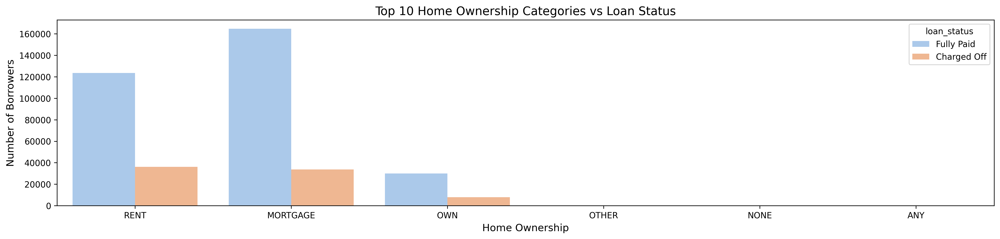

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filter for top 10 home_ownership categories
top_10_homeownership = data['home_ownership'].value_counts().head(10).index
filtered_data = data[data['home_ownership'].isin(top_10_homeownership)]

# Create a grouped bar plot
plt.figure(figsize=(20, 4))
sns.countplot(
    data=filtered_data,
    x='home_ownership',
    hue='loan_status',
    palette='pastel'
)

plt.title("Top 10 Home Ownership Categories vs Loan Status", fontsize=14)
plt.xlabel("Home Ownership", fontsize=12)
plt.ylabel("Number of Borrowers", fontsize=12)

Text(0, 0.5, 'Loan Amount')

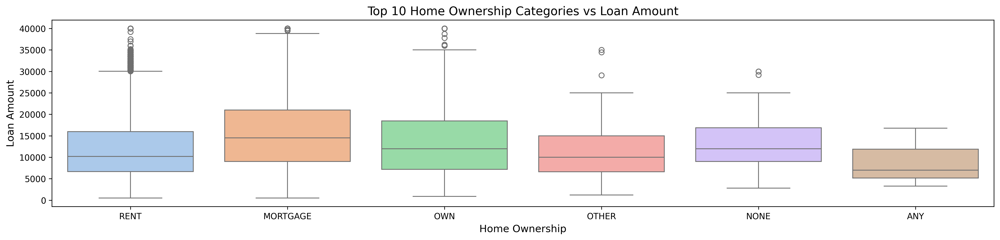

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Get the top 10 most common home_ownership categories
top_10_homeownership = data['home_ownership'].value_counts().head(10).index
filtered_data = data[data['home_ownership'].isin(top_10_homeownership)]
plt.figure(figsize=(20, 4))
sns.boxplot(x='home_ownership', y='loan_amnt', data=filtered_data, palette='pastel')
plt.title("Top 10 Home Ownership Categories vs Loan Amount", fontsize=14)
plt.xlabel("Home Ownership", fontsize=12)
plt.ylabel("Loan Amount", fontsize=12)

MORTGAGE: has the highest number of borrowers, followed by RENT and OWN. Indicates that most borrowers have either mortgaged or rented homes.
- Has a higher proportion of Fully Paid loans compared to Charged Off.
- Indicates financially stable borrowers with a good repayment record.

RENT: Shows a relatively higher proportion of Charged Off loans compared to MORTGAGE. Suggests that renters may have higher default risks due to potentially unstable financial conditions.

OWN: Borrowers with fully owned homes tend to have smaller overall counts but maintain a better Fully Paid to Charged Off ratio.

Loan Risk Patterns:
- Borrowers with MORTGAGE and OWN homes are low-risk and more likely to repay loans (Fully Paid).
- RENT borrowers represent a higher default risk and should be evaluated more cautiously during loan approval.



---



### **People with grades ‘A’ are more likely to fully pay their loan. (T/F)**


Text(0, 0.5, 'Number of Borrowers')

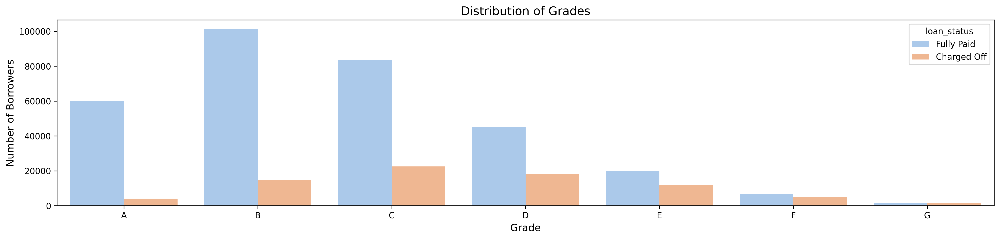

In [ ]:
# Extract grade order from mapping_dictionaries
grade_order = sorted(mapping_dictionaries['grade'], key=mapping_dictionaries['grade'].get)
data['grade'] = pd.Categorical(data['grade'], categories=grade_order, ordered=True)
plt.figure(figsize=(20, 4))
sns.countplot(data=data, hue='loan_status', x='grade', palette='pastel')
plt.title("Distribution of Grades", fontsize=14)
plt.xlabel("Grade", fontsize=12)
plt.ylabel("Number of Borrowers", fontsize=12)

- Borrowers are most concentrated in grades B and C, followed by grade A. These grades dominate the dataset.
- Higher grades (D, E, F, G) have progressively fewer borrowers, indicating that lower-rated borrowers are less common.

**Risk Management:**
- Grade A borrowers are the most reliable (low risk), while grades D to G present significant credit risks.
- this data can be used to fine-tune interest rates and approval criteria based on grade.

**Creditworthiness vs. Risk:**
The graph clearly shows a direct relationship between grades and loan performance:
- Higher grades (e.g., A, B) have better repayment performance (Fully Paid).
- Lower grades (e.g., E, F, G) are associated with higher default rates (Charged Off).

**Portfolio Analysis:**
Most loans in the dataset are concentrated in mid-to-high credit grades (B and C), indicating where most revenue and risk are concentrated.

**Targeted Strategies:**
- Encouraging lending to A, B, and C borrowers with appropriate terms.
- For lower grades (D and below), stricter approval criteria or higher interest rates may be necessary to mitigate risk.



---



### **Name the top 2 afforded job titles.**


Text(0, 0.5, 'Number of Borrowers')

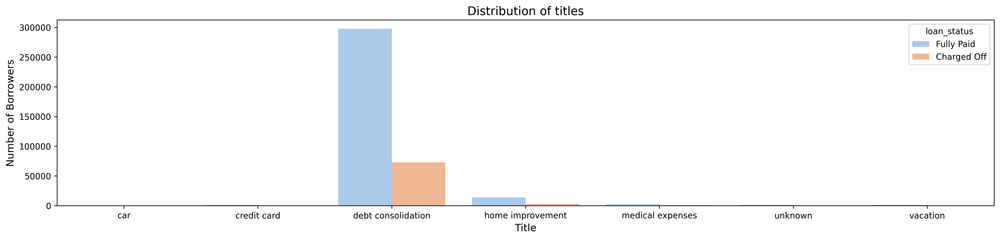

In [ ]:
titles_order = sorted(mapping_dictionaries['title_cleaned'], key=mapping_dictionaries['title_cleaned'].get)
data['title_cleaned'] = pd.Categorical(data['title_cleaned'], categories=titles_order, ordered=True)
plt.figure(figsize=(20, 4))
sns.countplot(data=data, hue='loan_status', x='title_cleaned', palette='pastel')
plt.title("Distribution of titles", fontsize=14)
plt.xlabel("Title", fontsize=12)
plt.ylabel("Number of Borrowers", fontsize=12)

- **Most Common Purpose:** Debt Consolidation dominates as the most common loan purpose, followed by smaller counts for Credit Card and Home Improvement.

- **Loan Status Split:** Debt Consolidation and Credit Card loans have a significant proportion of Fully Paid loans but also show noticeable Charged Off loans.

- **Less Common Titles:** Loan purposes like Medical Expenses, Vacation, and Unknown have very few borrowers.

- **Risk Implication:** Borrowers with less common purposes like Medical Expenses or Vacation might represent niche or riskier segments.



---



### **Thinking from a bank's perspective, which metric should our primary focus be on..??**
- ROC AUC
- Precision
- Recall
- F1 Score


The choice of metric depends on the bank's business priorities: ***Given LoanTap's goals of assessing borrower creditworthiness and predicting their capacity to repay loans, the primary focus should be on minimizing risks and optimizing lending decisions. Addressing the tradeoff between detecting real defaulters (minimizing false negatives) and reducing false positives (maximizing lending opportunities) is a critical balance for LoanTap.***

#### **Primary Focus for Loan Tap:**
Prioritize minimizing false negatives (recall) to avoid risky loans.

#### **Positive Class Definition:**
- The positive class (1) represents fully paid borrowers.
- The negative class (0) represents charged off borrowers.

The focus of the model shifts towards identifying reliable borrowers.

#### **Metric Focus with Fully Paid as Positive Class**


 1. **Balanced Metric: F1 Score** Balances Precision and Recall. Useful if LoanTap wants to achieve a trade-off between avoiding risky borrowers (false positives) and not rejecting too many creditworthy borrowers (false negatives).

  A cost function that combines the financial impact of false positives and false negatives: Custom cost function: cost = (false_positives * cost_fp) + (false_negatives * cost_fn)

 2. **Recall** ensures that the model identifies as many reliable borrowers (those likely to fully repay) as possible. This minimizes false negatives (creditworthy borrowers incorrectly classified as defaulters).

  Business Impact:
  - Helps LoanTap expand its customer base by reducing the risk of rejecting eligible borrowers.
  - Maximizes loan approvals for customers who are likely to repay.

 3. **Precision** ensures that when the model predicts Fully Paid, it is accurate. This minimizes false positives (defaulters incorrectly classified as reliable borrowers).

  Business Impact:
  - Ensures that LoanTap does not mistakenly approve risky loans, reducing potential losses.

 4. **Model Validation Metric: ROC AUC** Provides a broader view of the model's overall ability to separate Fully Paid and Charged Off borrowers. Useful during model evaluation but not actionable for day-to-day decisions.

#### **Key Challenges in Tradeoff**

1. Detecting Real Defaulters: High recall for defaulters is needed to ensure minimal false negatives (defaulters classified as reliable borrowers).
Missing defaulters increases the risk of non-performing assets (NPA).

2. Minimizing False Positives:
High precision for the positive class (Fully Paid) ensures that creditworthy borrowers are identified correctly.
Reducing false positives avoids missed lending opportunities and maximizes revenue from interest.

#### **Strategies to balance the trade off**

1. Adjusting model threshold probability for classification of borrowers credit worthiness to find an optimal balance
2. Use business logic in addition to the model’s predictions to reduce risky disbursements.
Example:
Even if a borrower is classified as Fully Paid, deny or reduce credit if:
  - Debt-to-income ratio exceeds a threshold.
  - Credit score is below a certain level.
  - Purpose of loan is flagged as high-risk.



# **Recommendation for LoanTap**

1. Optimize Lending (Balanced Approach):
Use F1 Score or a precision-recall tradeoff to ensure both risk and missed opportunities are balanced.
Gradually adjust the threshold based on historical data and performance.
2. Monitor Business Metrics:
Evaluate loan disbursement rates, default rates, and non-performing asset (NPA) percentages regularly.



---



### **How does the gap in precision and recall affect the bank?**



1. **For Positive Class (`Fully Paid`)**:
   - **Recall > Precision**:
     - Most reliable borrowers are approved, maximizing loan approvals and revenue opportunities.
     - However, some risky borrowers (false positives) are mistakenly approved, increasing default risks.

2. **For Negative Class (`Charged Off`)**:
   - **Precision > Recall**:
     - The model correctly identifies some defaulters, reducing unnecessary loan approvals.
     - However, many defaulters (false negatives) are missed, leading to high loan defaults and Non-Performing Assets (NPAs).

3. **Overall Impact on the Bank**:
   - **Revenue Opportunity**: High recall for `Fully Paid` ensures growth in loan approvals.
   - **Risk Management**: Low recall for `Charged Off` weakens the bank’s ability to mitigate risk, increasing defaults and NPAs.

The gap favors loan approvals but at the cost of higher default risk, necessitating improvements in identifying defaulters (class `0`) to strengthen risk management.

### **Which were the features that heavily affected the outcome?**


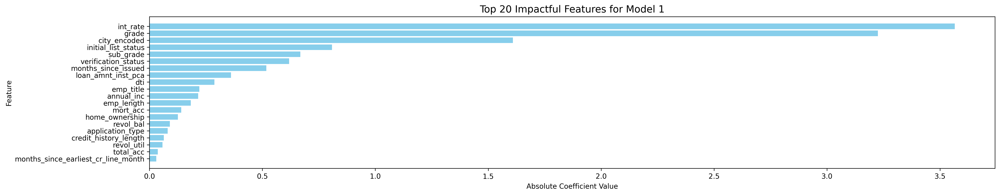

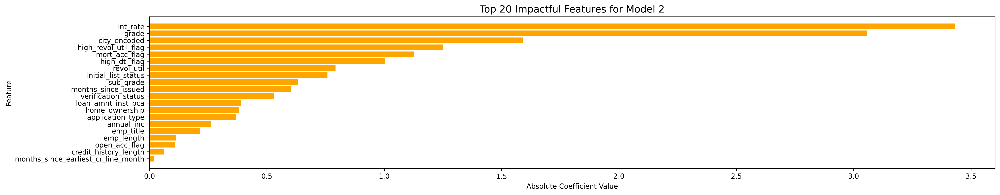

In [ ]:
# Plot for Model 1
plt.figure(figsize=(20, 4))
plt.barh(coef_df_model1['Feature'].head(20), coef_df_model1['Abs_Coefficient'].head(20), color='skyblue')
plt.xlabel("Absolute Coefficient Value")
plt.ylabel("Feature")
plt.title("Top 20 Impactful Features for Model 1", fontsize=14)
plt.gca().invert_yaxis()  # Invert y-axis to display the most impactful feature at the top
plt.tight_layout()
plt.show()

# Plot for Model 2
plt.figure(figsize=(20, 4))
plt.barh(coef_df_model2['Feature'].head(20), coef_df_model2['Abs_Coefficient'].head(20), color='orange')
plt.xlabel("Absolute Coefficient Value")
plt.ylabel("Feature")
plt.title("Top 20 Impactful Features for Model 2", fontsize=14)
plt.gca().invert_yaxis()  # Invert y-axis to display the most impactful feature at the top
plt.tight_layout()
plt.show()

## **Will the results be affected by geographical location? (Yes/No)**

Yes. City and State columns have been encoded using target encoding to capture the average repayment behavior (mean of the target variable, loan_status) for each city and state, respectively. These values are derived from K-Fold target encoding, which ensures that the encoding values are computed without data leakage.

The model results will be influenced by geographical location since target encoding uses region-specific repayment behaviors to inform predictions.

### **State Vs City Repayment Patterns**

scatter plot to analyze how state and city encodings relate, revealing patterns between regional and local repayment trends.

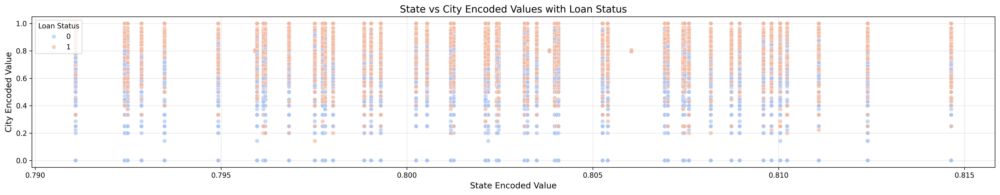

In [ ]:
# Scatter plot: State vs. City Encoded Values with Loan Status as Hue
plt.figure(figsize=(20, 4))
sns.scatterplot(
    data=data_encoded,
    x='state_encoded',
    y='city_encoded',
    hue='loan_status',
    palette='coolwarm',
    alpha=0.7
)
plt.title("State vs City Encoded Values with Loan Status", fontsize=14)
plt.xlabel("State Encoded Value", fontsize=12)
plt.ylabel("City Encoded Value", fontsize=12)
plt.legend(title="Loan Status", loc="upper left")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


- Cities with repayment patterns consistent with their states appear clustered vertically, indicating alignment between local and regional repayment trends.
- Consistent Regions: States with tightly clustered city values (narrow vertical spread) indicate uniform repayment behavior.
- Outlier Regions: States with wide vertical spread suggest cities with unique repayment characteristics, which could require targeted strategies.
- This can help identify patterns such as:
  - Clusters of cities and states with high default rates.
  - Regions where most loans are successfully repaid.

**Variation Among Cities:**
The spread of city-encoded values within a state indicates intra-state variation in repayment behavior.
Some cities significantly deviate from the state average, suggesting localized factors affecting repayment trends.

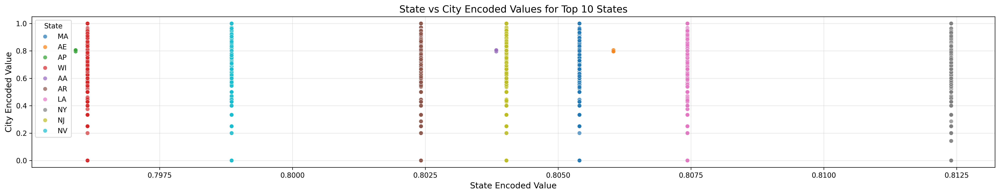

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Step 1: Get the top 10 states by number of borrowers
top_states = data_encoded['state'].value_counts().head(10).index

# Step 2: Filter data for the top 10 states
filtered_data = data_encoded[data_encoded['state'].isin(top_states)]

# Step 3: Scatter plot for top 10 states
plt.figure(figsize=(20, 4))
sns.scatterplot(
    data=filtered_data,
    x='state_encoded',
    y='city_encoded',
    hue='state',
    palette='tab10',
    alpha=0.7
)
plt.title("State vs City Encoded Values for Top 10 States", fontsize=14)
plt.xlabel("State Encoded Value", fontsize=12)
plt.ylabel("City Encoded Value", fontsize=12)
plt.legend(title="State", loc="upper left")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

### **State Trends in Repayment Behaviour**

Visualize average repayment behavior (state_encoded) for each state using a bar plot.

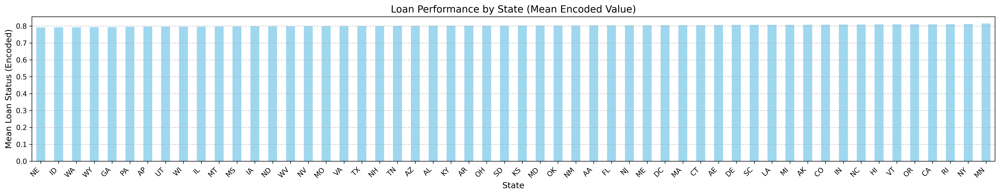

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Sort states by encoded value
state_performance = data_encoded.groupby('state')['state_encoded'].mean().sort_values()

# Plot loan performance trends by state
plt.figure(figsize=(20, 4))
state_performance.plot(kind='bar', color='skyblue', alpha=0.8)
plt.title("Loan Performance by State (Mean Encoded Value)", fontsize=14)
plt.xlabel("State", fontsize=12)
plt.ylabel("Mean Loan Status (Encoded)", fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


- states with lower encoded values (indicating higher default rates).

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a hierarchical DataFrame for state and city encoded values
heatmap_data = data_encoded.groupby(['state', 'city']).mean()[['state_encoded', 'city_encoded']].unstack()

# Plot the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(
    heatmap_data['city_encoded'],  # Focus on city-level trends within each state
    cmap='YlGnBu',
    annot=True,
    fmt=".2f",
    linewidths=0.5,
    cbar=True
)
plt.title("Combined Heatmap of Loan Performance by State and City", fontsize=14)
plt.xlabel("City")
plt.ylabel("State")
plt.tight_layout()
plt.show()


### **City Trends in Repayment Behaviour**

Focus on the top 20 cities with the most borrowers and plot their average repayment behavior (city_encoded).

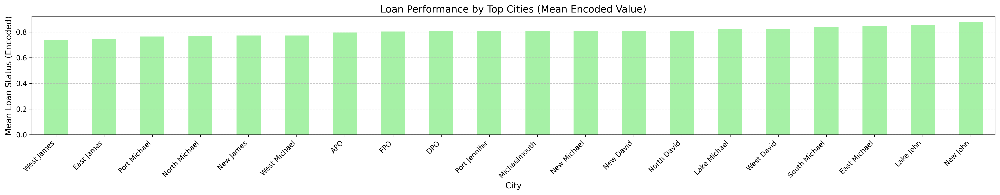

In [ ]:
# Sort cities by encoded value
top_cities = data_encoded['city'].value_counts().head(20).index  # Top 20 cities
city_performance = data_encoded[data_encoded['city'].isin(top_cities)].groupby('city')['city_encoded'].mean().sort_values()

# Plot loan performance trends by city
plt.figure(figsize=(20, 4))
city_performance.plot(kind='bar', color='lightgreen', alpha=0.8)
plt.title("Loan Performance by Top Cities (Mean Encoded Value)", fontsize=14)
plt.xlabel("City", fontsize=12)
plt.ylabel("Mean Loan Status (Encoded)", fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


- Highlight cities with significant deviations in repayment probabilities.